In [1]:
import pandas as pd
import pickle
import sklearn
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn import pipeline
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;


<IPython.core.display.Javascript object>

In [3]:
EICU_PATH = "/data/processed/eicu_processed/data/adult_data.csv"
STATIC_VARS = [
    "admissionheight", "admissionweight", "age"
]

TIME_SERIES_VARS = [
    "FiO2", "Heart Rate", "Invasive BP Diastolic", "Invasive BP Systolic", "O2 Saturation", "Respiratory Rate",
    "Temperature (C)", "glucose", "Motor", "Eyes", "MAP (mmHg)", "GCS Total", "Verbal", "pH"
]
TARGET = "hospitaldischargestatus"

In [4]:
with open("../uncertainty_estimation/experiments_utils/common_eicu_params.pkl", "rb") as f:
    feat_columns = pickle.load(f)

In [5]:
TARGET in feat_columns

False

In [6]:
eicu_data = pd.read_csv(EICU_PATH, dtype=float)

In [7]:
print("Num stays: ", len(eicu_data))
print("Mortality rate: ", eicu_data["hospitaldischargestatus"].mean())

Num stays:  38072
Mortality rate:  0.1253939903341038


In [8]:
eicu_features = eicu_data[feat_columns + [TARGET]]

In [9]:
print(eicu_features)

       Invasive BP Diastolic_full_min  Invasive BP Diastolic_full_max  \
0                                59.0                           104.0   
1                                75.0                           106.0   
2                                48.0                            91.0   
3                                48.0                           101.0   
4                                44.0                           102.0   
...                               ...                             ...   
38067                            41.0                           103.0   
38068                            48.0                           108.0   
38069                            27.0                            88.0   
38070                             NaN                             NaN   
38071                            36.0                            93.0   

       Invasive BP Diastolic_full_mean  Invasive BP Diastolic_full_std  \
0                            82.184615           

In [10]:
X, y = eicu_features[feat_columns], eicu_features[TARGET]

In [11]:
pipe = pipeline.Pipeline(
    [("scaler", StandardScaler()), ("imputer", SimpleImputer())]
)
pipe.fit(X.copy())
X_projected = pipe.transform(X.copy())

In [55]:
tsne = sklearn.manifold.TSNE(verbose=2, n_jobs=-1)
X_projected = tsne.fit_transform(X_projected)
np.save("eicu_projected2.npy", X_projected)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 38072 samples in 11.260s...
[t-SNE] Computed neighbors for 38072 samples in 167.510s...
[t-SNE] Computed conditional probabilities for sample 1000 / 38072
[t-SNE] Computed conditional probabilities for sample 2000 / 38072
[t-SNE] Computed conditional probabilities for sample 3000 / 38072
[t-SNE] Computed conditional probabilities for sample 4000 / 38072
[t-SNE] Computed conditional probabilities for sample 5000 / 38072
[t-SNE] Computed conditional probabilities for sample 6000 / 38072
[t-SNE] Computed conditional probabilities for sample 7000 / 38072
[t-SNE] Computed conditional probabilities for sample 8000 / 38072
[t-SNE] Computed conditional probabilities for sample 9000 / 38072
[t-SNE] Computed conditional probabilities for sample 10000 / 38072
[t-SNE] Computed conditional probabilities for sample 11000 / 38072
[t-SNE] Computed conditional probabilities for sample 12000 / 38072
[t-SNE] Computed conditional probabilities for 

In [12]:
# Load projected samples to save the ultra-slow t-SNE in scikit-leanr 0.23.1
X_projected = np.load("eicu_projected2.npy")

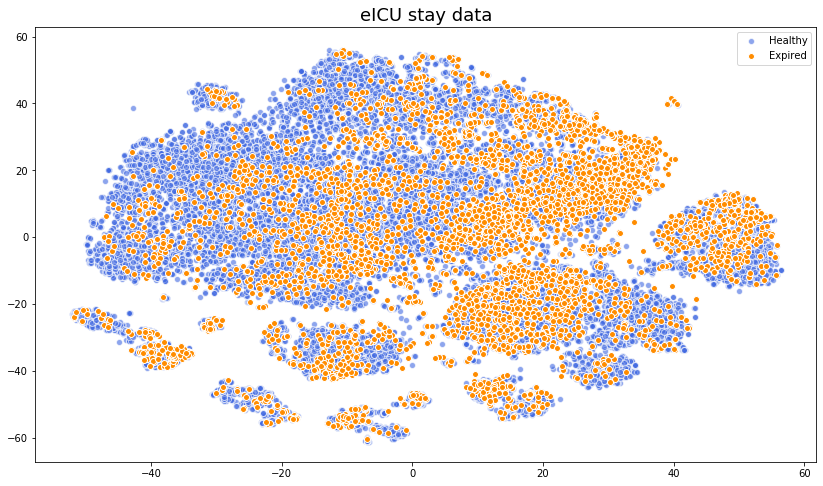

In [13]:
plt.rcParams["figure.figsize"] = (14,8)
for cls, label, color, alph in zip([0, 1], ["Healthy", "Expired"], ["royalblue", "darkorange"], [0.6, 1]):
    plt.scatter(
        X_projected[:, 0][y == cls], X_projected[:, 1][y == cls], 
        alpha=alph, c=color, label=label, edgecolor="w"
    )
plt.title("eICU stay data", fontsize=18)
plt.legend()
plt.show()

/home/dennis/.conda/envs/eicu/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:447: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
/home/dennis/.conda/envs/eicu/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:447: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


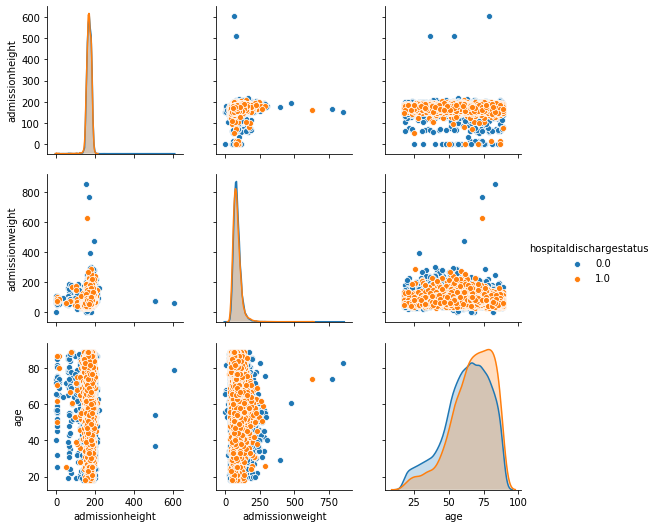

In [15]:
pair_plot = sns.pairplot(eicu_data, vars=STATIC_VARS, hue=TARGET)
pair_plot

FiO2 features
['FiO2_full_mean', 'FiO2_full_max', 'FiO2_full_min', 'FiO2_full_std', 'FiO2_full_skew', 'FiO2_full_num']


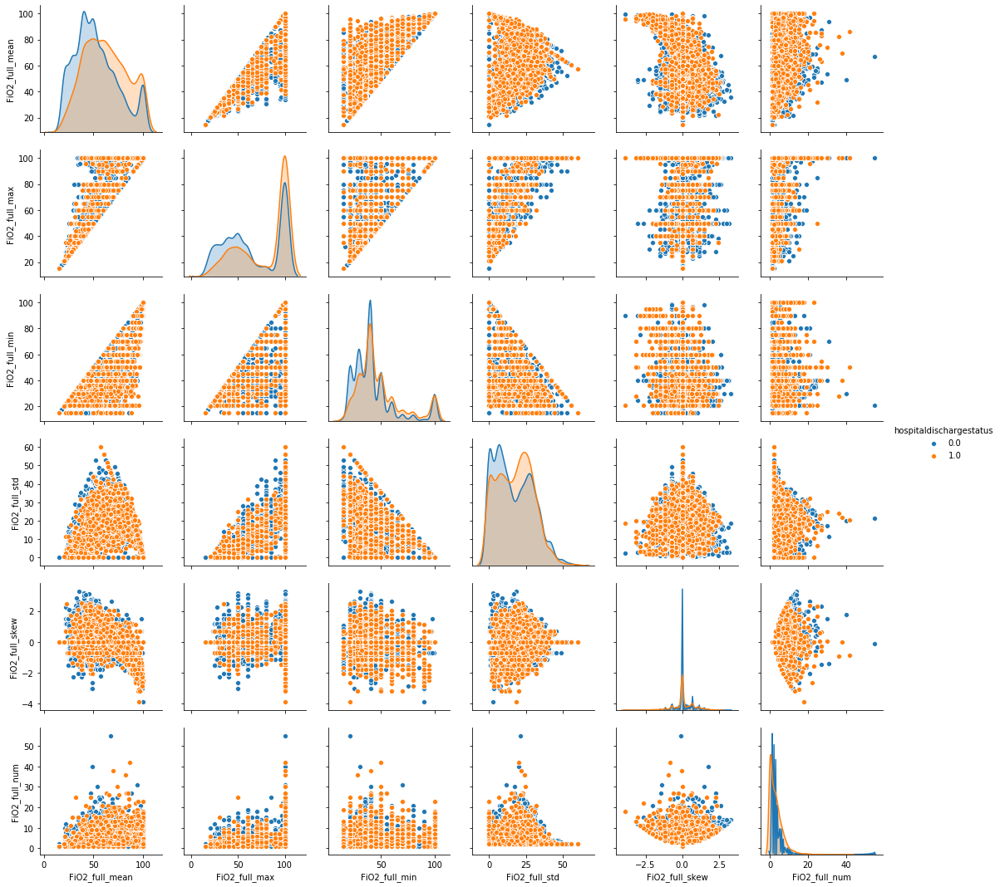






Heart Rate features
['Heart Rate_full_mean', 'Heart Rate_full_max', 'Heart Rate_full_min', 'Heart Rate_full_std', 'Heart Rate_full_skew', 'Heart Rate_full_num']


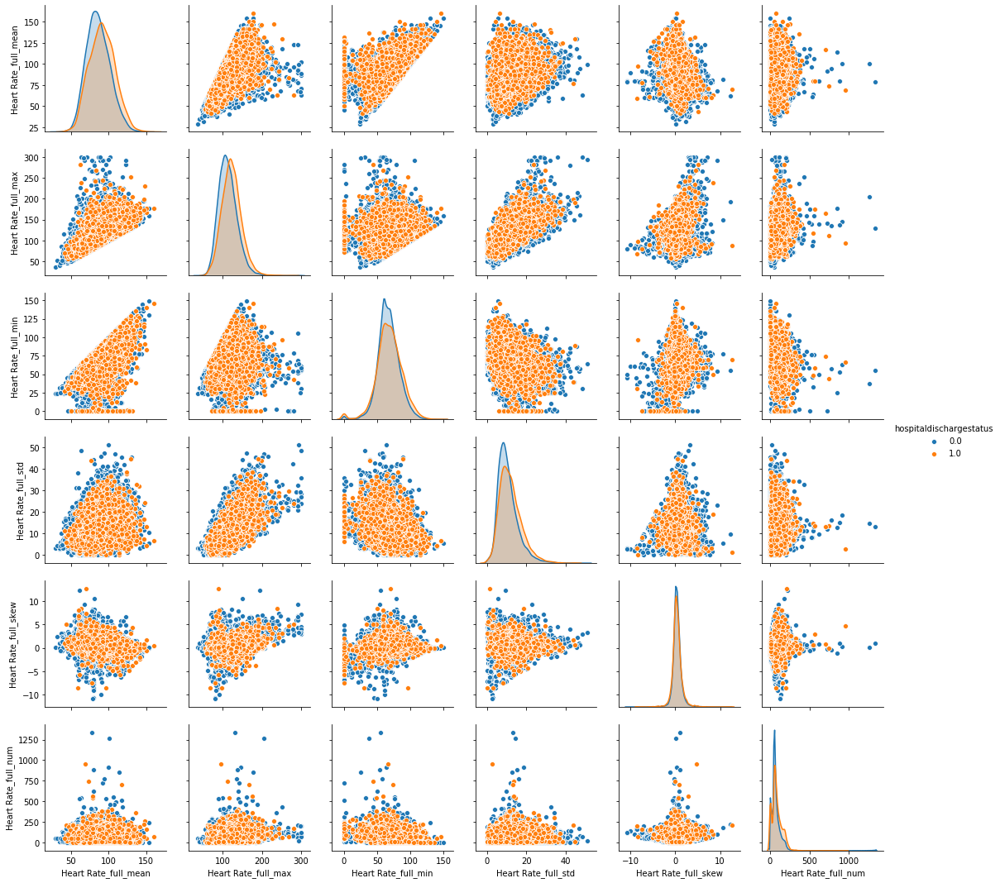






Invasive BP Diastolic features
['Invasive BP Diastolic_full_mean', 'Invasive BP Diastolic_full_max', 'Invasive BP Diastolic_full_min', 'Invasive BP Diastolic_full_std', 'Invasive BP Diastolic_full_skew', 'Invasive BP Diastolic_full_num']


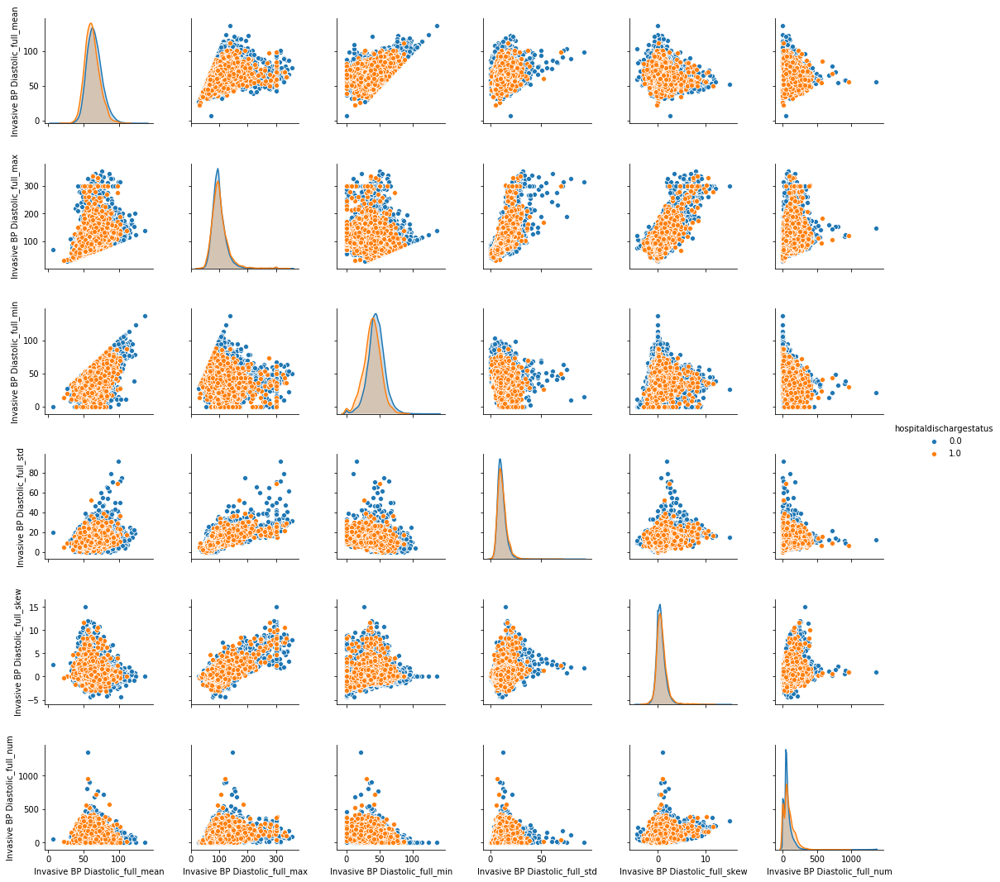






Invasive BP Systolic features
['Invasive BP Systolic_full_mean', 'Invasive BP Systolic_full_max', 'Invasive BP Systolic_full_min', 'Invasive BP Systolic_full_std', 'Invasive BP Systolic_full_skew', 'Invasive BP Systolic_full_num']


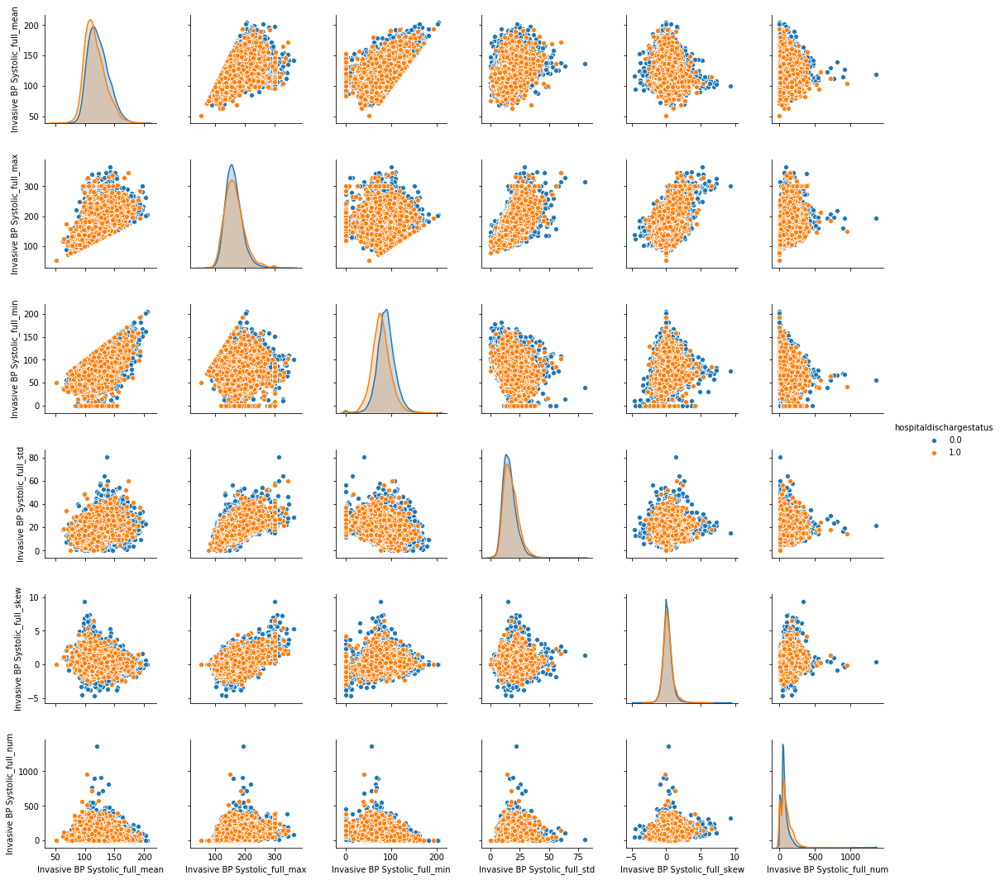






O2 Saturation features
['O2 Saturation_full_mean', 'O2 Saturation_full_max', 'O2 Saturation_full_min', 'O2 Saturation_full_std', 'O2 Saturation_full_skew', 'O2 Saturation_full_num']


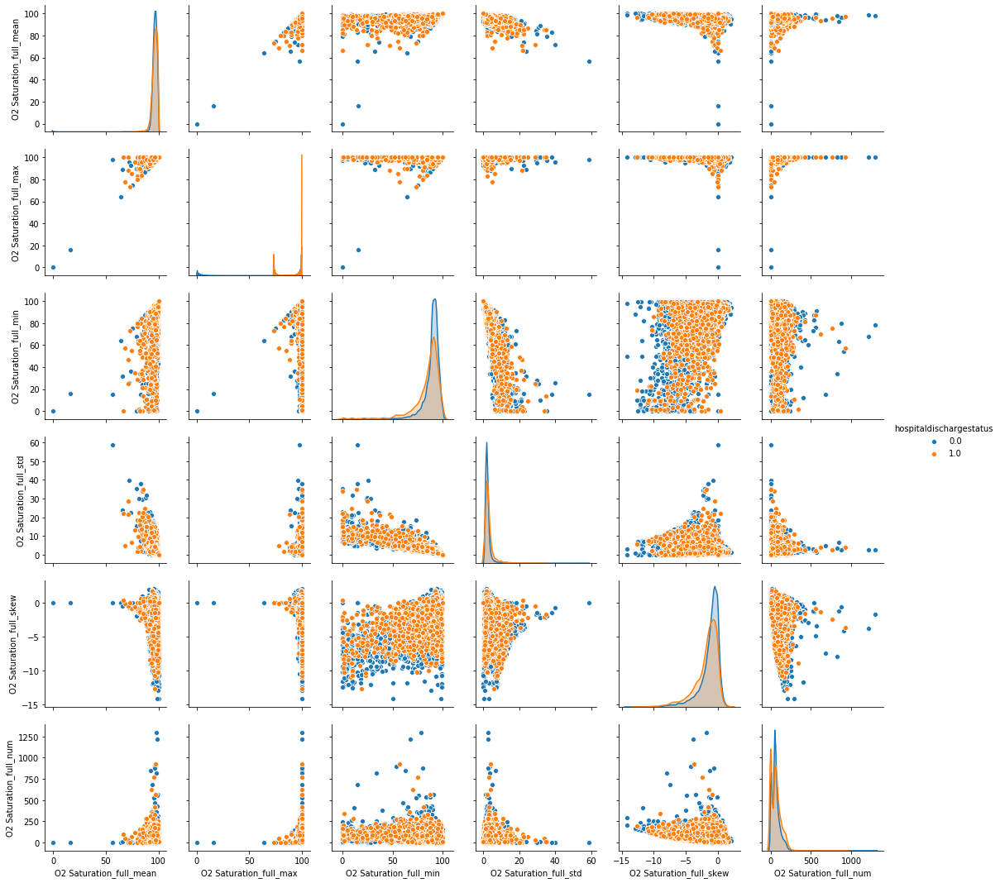






Respiratory Rate features
['Respiratory Rate_full_mean', 'Respiratory Rate_full_max', 'Respiratory Rate_full_min', 'Respiratory Rate_full_std', 'Respiratory Rate_full_skew', 'Respiratory Rate_full_num']


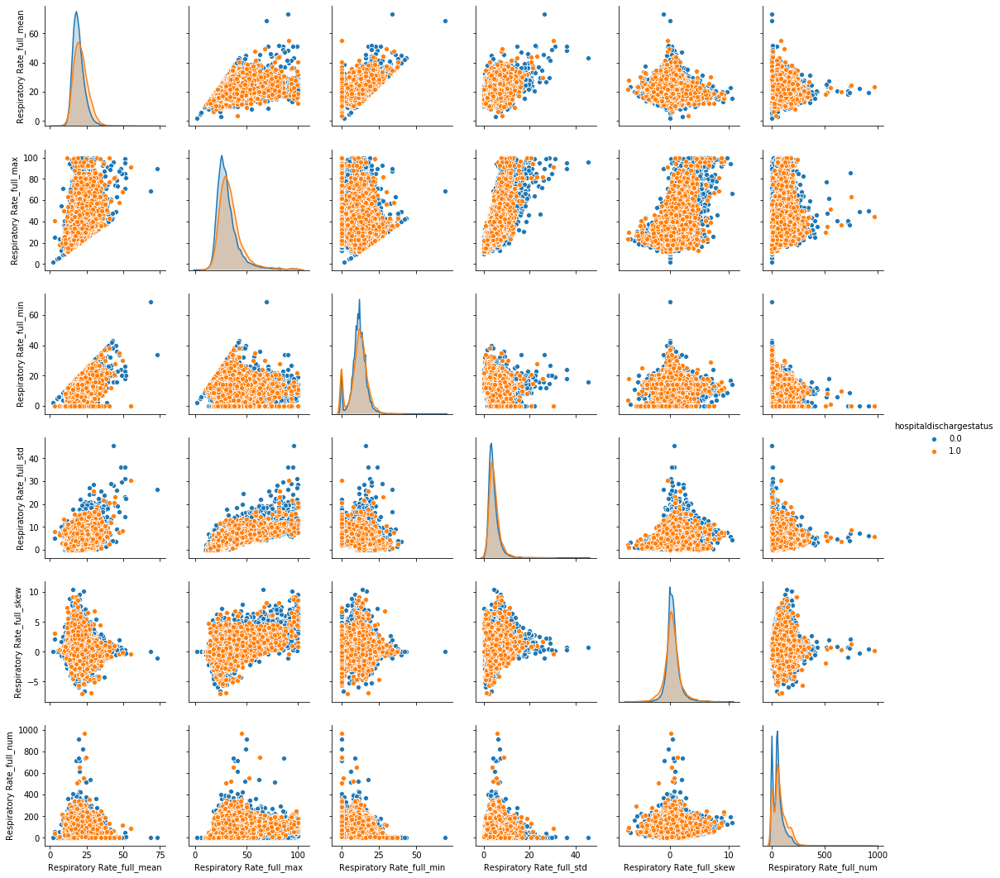






Temperature (C) features
['Temperature (C)_full_mean', 'Temperature (C)_full_max', 'Temperature (C)_full_min', 'Temperature (C)_full_std', 'Temperature (C)_full_skew', 'Temperature (C)_full_num']


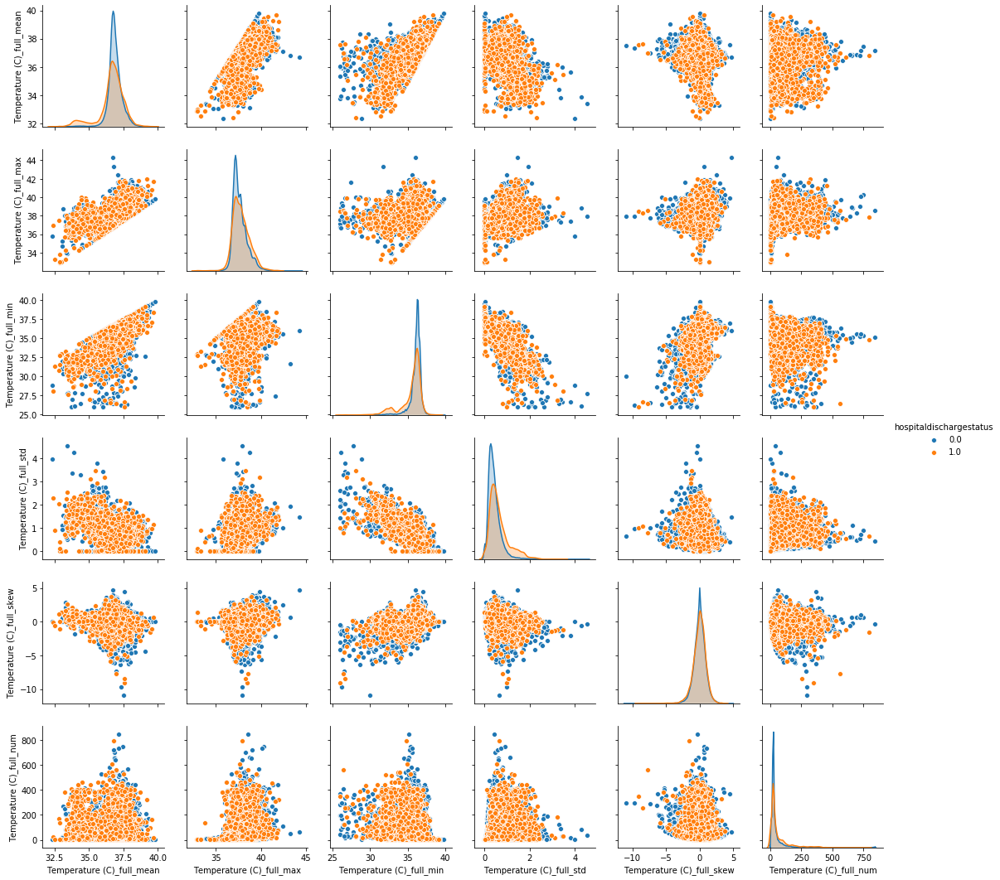






glucose features
['glucose_full_mean', 'glucose_full_max', 'glucose_full_min', 'glucose_full_std', 'glucose_full_skew', 'glucose_full_num']


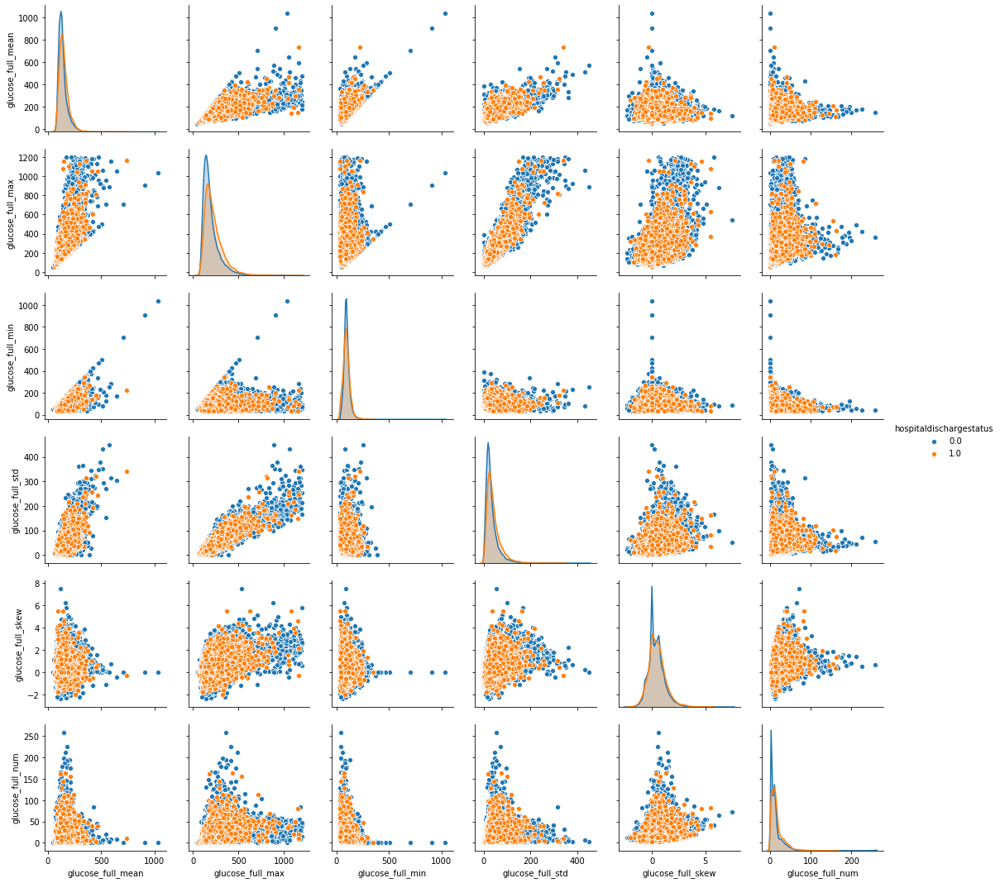






MAP (mmHg) features
['MAP (mmHg)_full_mean', 'MAP (mmHg)_full_max', 'MAP (mmHg)_full_min', 'MAP (mmHg)_full_std', 'MAP (mmHg)_full_skew', 'MAP (mmHg)_full_num']


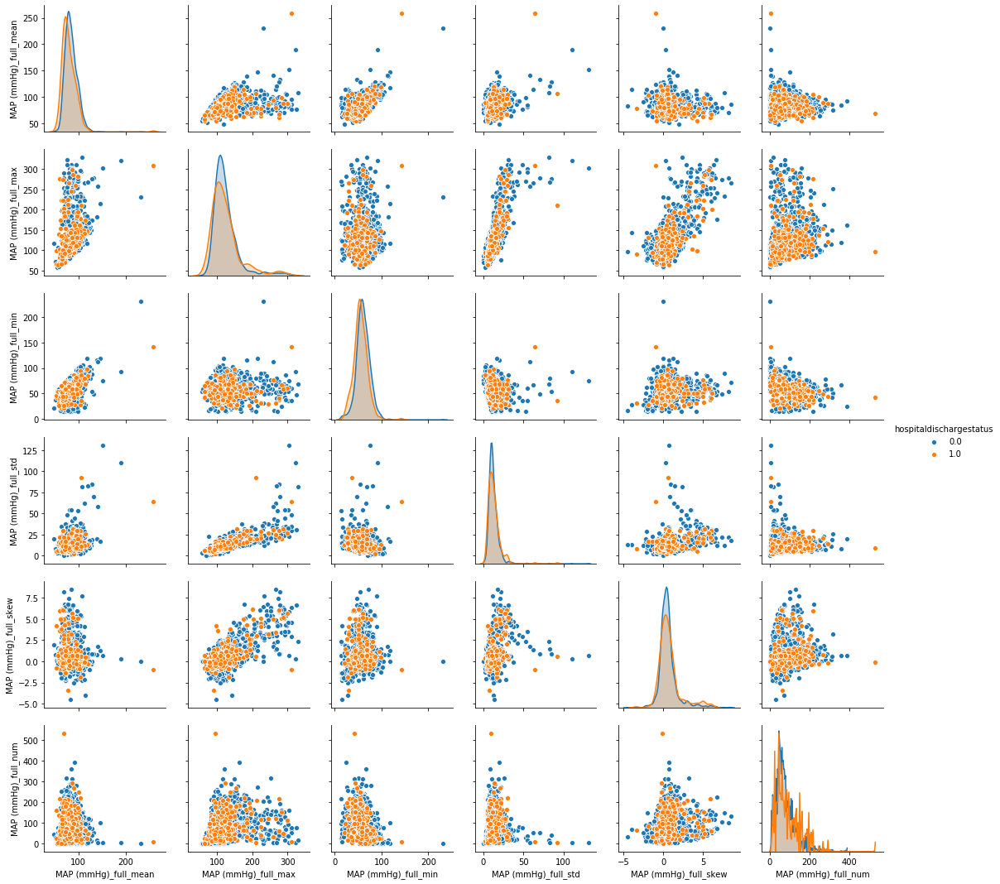






GCS Total features
['GCS Total_full_mean', 'GCS Total_full_max', 'GCS Total_full_min', 'GCS Total_full_std', 'GCS Total_full_skew', 'GCS Total_full_num']


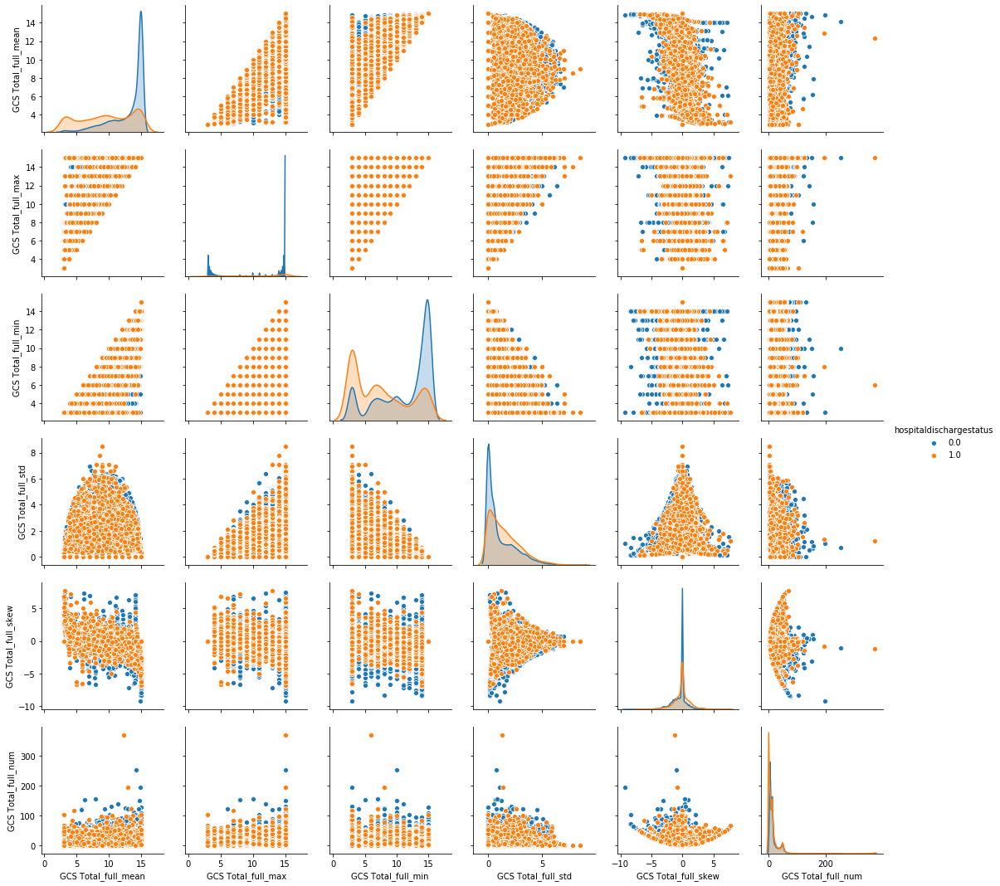






pH features
['pH_full_mean', 'pH_full_max', 'pH_full_min', 'pH_full_std', 'pH_full_skew', 'pH_full_num']


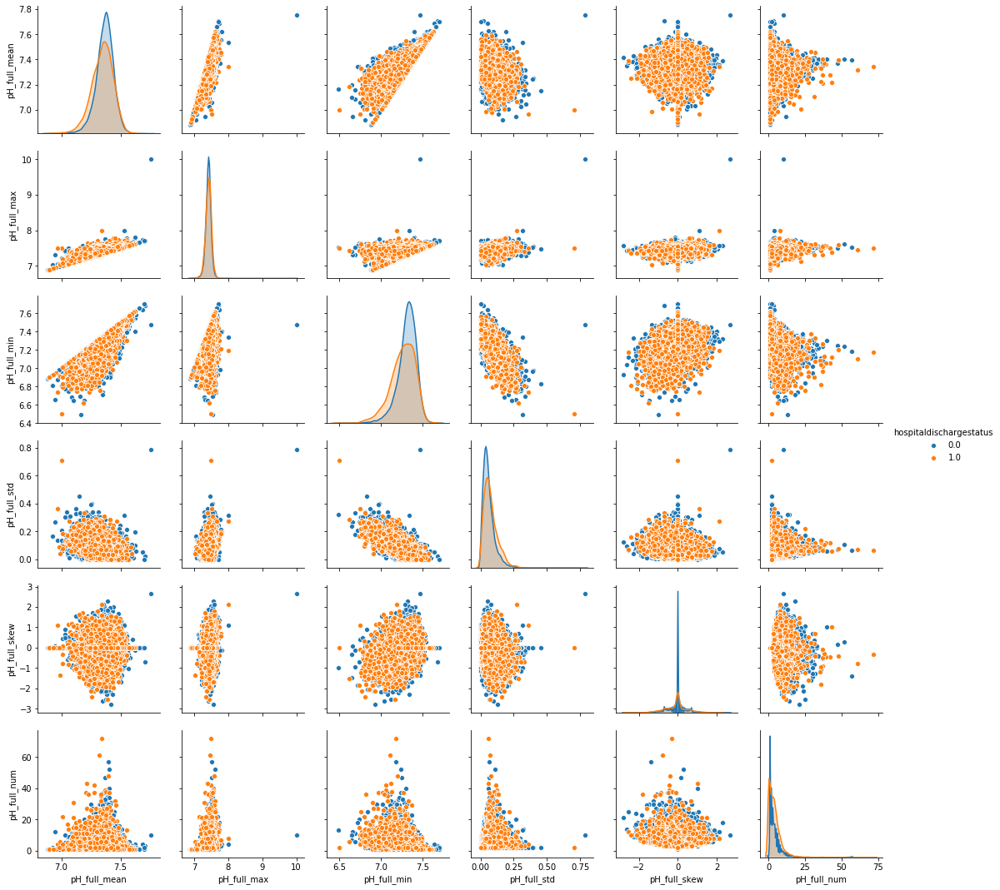

In [16]:
for var in TIME_SERIES_VARS:
    if var in ["Motor", "Eyes", "Verbal"]:
        continue
        
    vars_ = [v for v in feat_columns if var in v and "full" in v]
    print(f"{var} features")
    print(vars_)
    pairplot = sns.pairplot(eicu_data, vars=vars_, hue=TARGET)
    plt.show()
    print("\n" * 4)

In [17]:
# Check nans
for col in feat_columns:
    percentage_nan = eicu_data[col].isna().sum() / len(eicu_data)
    if percentage_nan > 0:
        print(f"{col} contains {percentage_nan:.2f} % NaNs.")

admissionheight contains 0.01 % NaNs.
admissionweight contains 0.02 % NaNs.
FiO2_last50_mean contains 0.49 % NaNs.
FiO2_last25_mean contains 0.49 % NaNs.
FiO2_first50_mean contains 0.49 % NaNs.
FiO2_last10_mean contains 0.49 % NaNs.
FiO2_full_mean contains 0.49 % NaNs.
FiO2_first25_mean contains 0.49 % NaNs.
FiO2_first10_mean contains 0.49 % NaNs.
FiO2_last50_max contains 0.49 % NaNs.
FiO2_last25_max contains 0.49 % NaNs.
FiO2_first50_max contains 0.49 % NaNs.
FiO2_last10_max contains 0.49 % NaNs.
FiO2_full_max contains 0.49 % NaNs.
FiO2_first25_max contains 0.49 % NaNs.
FiO2_first10_max contains 0.49 % NaNs.
FiO2_last50_min contains 0.49 % NaNs.
FiO2_last25_min contains 0.49 % NaNs.
FiO2_first50_min contains 0.49 % NaNs.
FiO2_last10_min contains 0.49 % NaNs.
FiO2_full_min contains 0.49 % NaNs.
FiO2_first25_min contains 0.49 % NaNs.
FiO2_first10_min contains 0.49 % NaNs.
FiO2_last50_std contains 0.74 % NaNs.
FiO2_last25_std contains 0.87 % NaNs.
FiO2_first50_std contains 0.65 % NaNs.
F

glucose_last50_mean contains 0.01 % NaNs.
glucose_last25_mean contains 0.01 % NaNs.
glucose_first50_mean contains 0.01 % NaNs.
glucose_last10_mean contains 0.01 % NaNs.
glucose_full_mean contains 0.01 % NaNs.
glucose_first25_mean contains 0.01 % NaNs.
glucose_first10_mean contains 0.01 % NaNs.
glucose_last50_max contains 0.01 % NaNs.
glucose_last25_max contains 0.01 % NaNs.
glucose_first50_max contains 0.01 % NaNs.
glucose_last10_max contains 0.01 % NaNs.
glucose_full_max contains 0.01 % NaNs.
glucose_first25_max contains 0.01 % NaNs.
glucose_first10_max contains 0.01 % NaNs.
glucose_last50_min contains 0.01 % NaNs.
glucose_last25_min contains 0.01 % NaNs.
glucose_first50_min contains 0.01 % NaNs.
glucose_last10_min contains 0.01 % NaNs.
glucose_full_min contains 0.01 % NaNs.
glucose_first25_min contains 0.01 % NaNs.
glucose_first10_min contains 0.01 % NaNs.
glucose_last50_std contains 0.09 % NaNs.
glucose_last25_std contains 0.29 % NaNs.
glucose_first50_std contains 0.03 % NaNs.
gluco

pH_first10_std contains 0.95 % NaNs.
pH_last50_skew contains 0.43 % NaNs.
pH_last25_skew contains 0.43 % NaNs.
pH_first50_skew contains 0.43 % NaNs.
pH_last10_skew contains 0.43 % NaNs.
pH_full_skew contains 0.43 % NaNs.
pH_first25_skew contains 0.43 % NaNs.
pH_first10_skew contains 0.43 % NaNs.


In [18]:
def shuffle_data(X: np.array, y: np.array):
    """ 
    Jointly shuffle a data set and labels.
    
    :param X: Data samples. 
    :param y: Labels.
    :returnss: Shuffled samples and labels as tuple.
    """
    idx = np.arange(0, X.shape[0])
    np.random.shuffle(idx)
    
    X, y = X[idx, :], y[idx]
    
    return X, y

In [19]:
X_full, y_full = X.to_numpy(), y.to_numpy()
X_full, y_full = shuffle_data(X_full, y_full)
cutoff = int(0.8 * len(X_full))
X_train, X_test = X_full[:cutoff], X_full[cutoff:]
y_train, y_test = y_full[:cutoff], y_full[cutoff:]

In [25]:
from sklearn.metrics import roc_auc_score

from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn import pipeline
from sklearn.preprocessing import StandardScaler

pipe = pipeline.Pipeline([('scaler', StandardScaler()),
                          ('imputer', SimpleImputer())])
pipe.fit(X_train)
X_train = pipe.transform(X_train)
X_test = pipe.transform(X_test)
lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict_proba(X_test)[:,1]
roc_auc_score(y_test, y_pred)

/home/dennis/.conda/envs/eicu/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


0.8371429699530146

In [29]:
num_lrs = 10
weights = np.zeros(lr.coef_[0].shape)

for _ in range(num_lrs):
    lr = LogisticRegression()
    lr.fit(X_train, y_train)
    weights += lr.coef_[0]
    
weights /= num_lrs
sorted_weights_and_feats = sorted(
    [(abs(weight), feature) for weight, feature in zip(weights, feat_columns)], 
    key=lambda tpl: tpl[0], reverse=True
)

print("Top 20 feature by absolute Log. Reg. weights:")
for i, (weight, feat) in enumerate(sorted_weights_and_feats[:20]):
    print(f"{i+1}. {feat} ({weight:.2f})")

/home/dennis/.conda/envs/eicu/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/home/dennis/.conda/envs/eicu/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/

Top 20 feature by absolute Log. Reg. weights:
1. pH_first10_min (0.62)
2. pH_first10_max (0.59)
3. age (0.45)
4. GCS Total_first10_max (0.44)
5. pH_last10_min (0.42)
6. pH_last10_max (0.40)
7. GCS Total_full_num (0.39)
8. Temperature (C)_first10_mean (0.39)
9. Invasive BP Diastolic_last10_mean (0.36)
10. Invasive BP Systolic_last10_mean (0.36)
11. O2 Saturation_last10_mean (0.36)
12. GCS Total_last10_num (0.33)
13. Eyes_first10_max (0.33)
14. GCS Total_last10_min (0.33)
15. Eyes_first10_min (0.33)
16. Eyes_first25_min (0.33)
17. pH_last10_num (0.32)
18. FiO2_first50_num (0.32)
19. GCS Total_last50_min (0.31)
20. Invasive BP Diastolic_first10_num (0.31)


/home/dennis/.conda/envs/eicu/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [32]:
from sklearn.cluster import dbscan

X_cluster = pipe.transform(X.to_numpy())
core_samples, labels = dbscan(X_cluster, min_samples=20, n_jobs=-1, eps=14.75)
np.save("eicu_dbscan.npy", labels)

In [33]:
labels = np.load("eicu_dbscan.npy")
print(labels)

[-1  0  0 ...  0  1 -1]


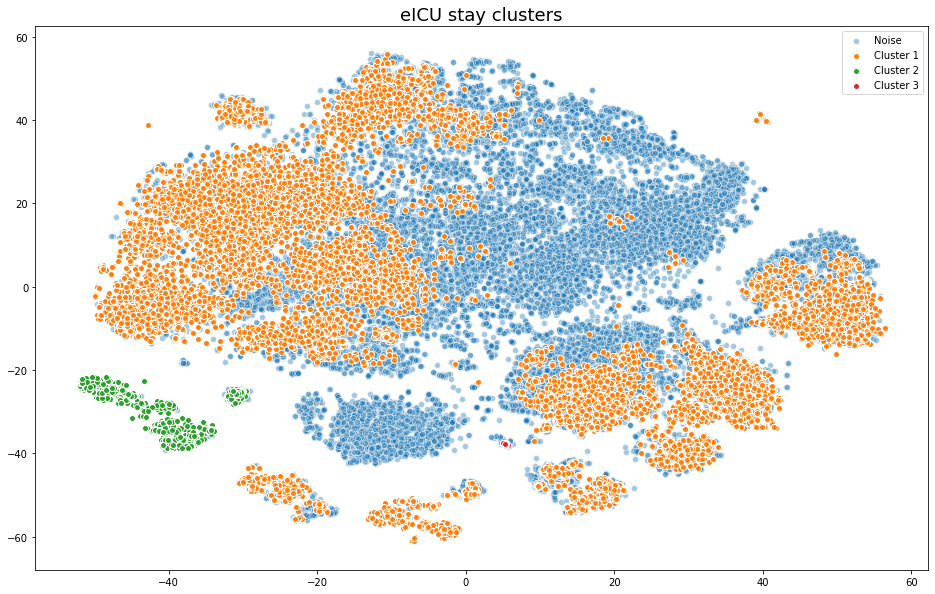

In [34]:
plt.rcParams["figure.figsize"] = (16,10)
for cls, cls_name, alph in zip(range(-1, np.max(labels) + 1), ["Noise"] + [f"Cluster {i+1}" for i in range(max(labels) + 1)], [0.4] + [1] * len(set(labels))):
    plt.scatter(
        X_projected[:, 0][labels == cls], X_projected[:, 1][labels == cls], 
        label=cls_name, edgecolor="w", alpha=alph
    )
plt.title("eICU stay clusters", fontsize=18)
plt.legend()
plt.show()

In [133]:
eicu_cluster_data = eicu_data.copy()
cluster_feat_columns = feat_columns
#cluster_feat_columns = [column for column in feat_columns if "num" not in column]
#eicu_cluster_data[feat_columns] = scaler.fit_transform(eicu_cluster_data[feat_columns])

# Get mean values for interest args
for cluster in range(max(labels) + 1):
    print(f"Cluster {cluster+1} {y[labels==cluster].mean()*100:.2f} %")
    cluster_data = eicu_cluster_data[labels==cluster][cluster_feat_columns]
    diff_ = (eicu_data[cluster_feat_columns].mean() - cluster_data.mean())
    diff = diff_.apply(abs)
    diff.sort_values(inplace=True, ascending=False)
    diff = diff_[diff.index]  # Get old values (otherwise we cannot distinguish negative from positive)
    print(diff[:15], "\n")

Cluster 1 11.28 %
MAP (mmHg)_full_max        67.900357
MAP (mmHg)_first50_max     58.248436
MAP (mmHg)_first25_max     56.812779
MAP (mmHg)_last50_max      56.066577
MAP (mmHg)_first10_max     51.017873
MAP (mmHg)_last25_max      49.402592
MAP (mmHg)_last10_max      43.184987
MAP (mmHg)_first10_mean    34.782781
MAP (mmHg)_first25_mean    32.733809
MAP (mmHg)_last10_mean     30.085162
MAP (mmHg)_full_mean       29.804492
MAP (mmHg)_first50_mean    29.469589
MAP (mmHg)_last25_mean     29.184663
MAP (mmHg)_last50_mean     28.045125
glucose_full_max           22.057283
dtype: float64 

Cluster 2 12.16 %
O2 Saturation_full_num            55.614389
glucose_full_max                  32.986421
Temperature (C)_full_num         -31.752118
Respiratory Rate_full_num        -31.390881
Invasive BP Diastolic_full_num   -31.126750
Invasive BP Systolic_full_num    -31.076086
glucose_first50_max               30.335847
glucose_first25_max               28.938800
O2 Saturation_first50_num         28.425

In [143]:
from pacmagic.analyzing.pacmed_analyzer import PacmedAnalyzer
analyzer_feat_columns = STATIC_VARS + [column for column in feat_columns if "full_mean" in column]
analyzer = PacmedAnalyzer(data=eicu_data, input_features=analyzer_feat_columns, outcome_features=["hospitaldischargestatus"])

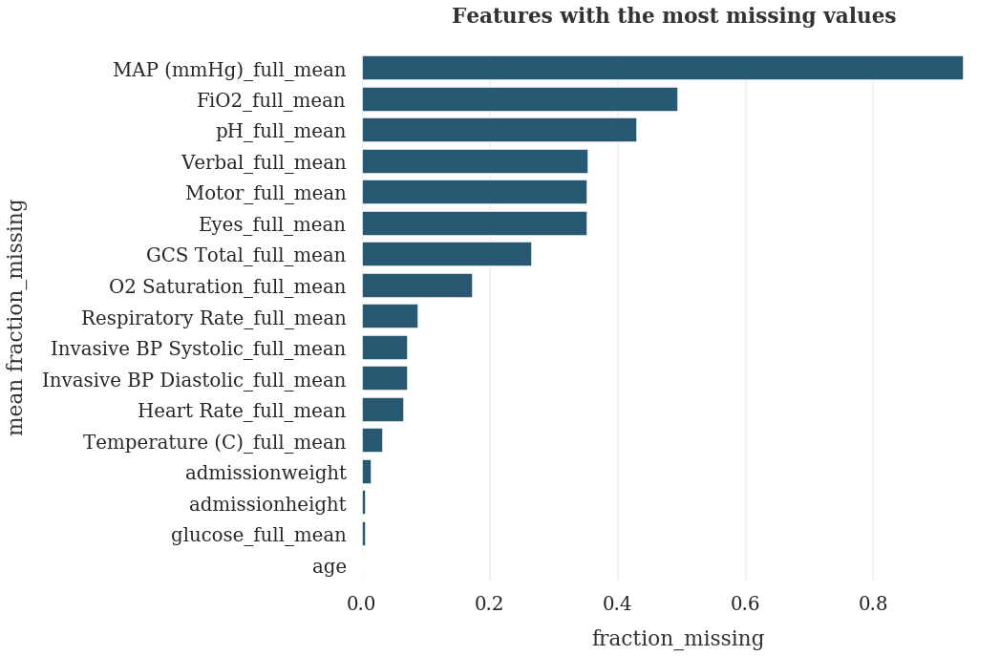

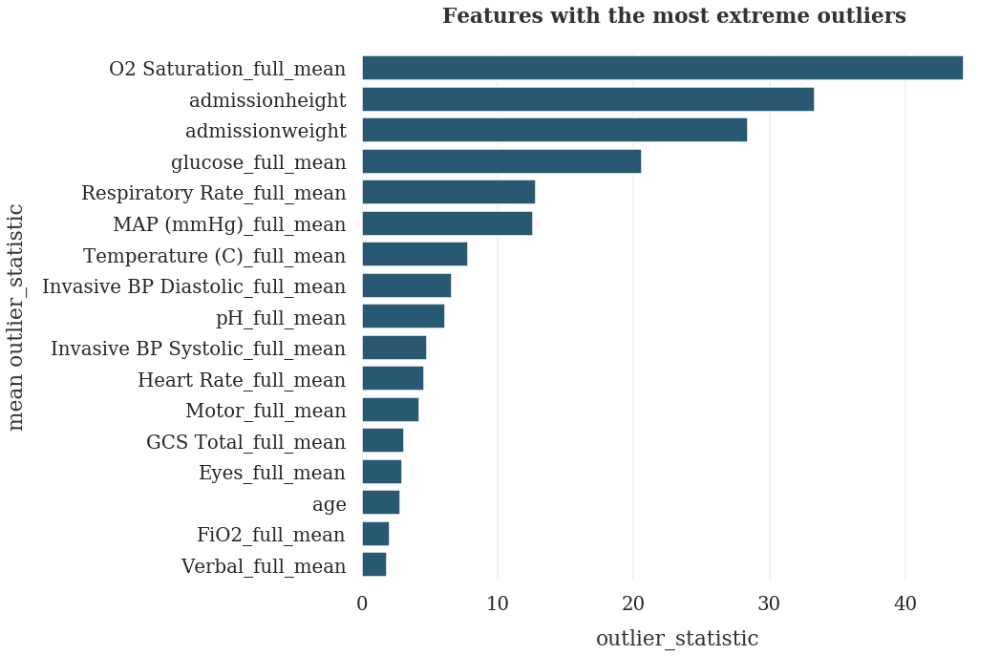

  0%|          | 0/17 [00:00<?, ?it/s]

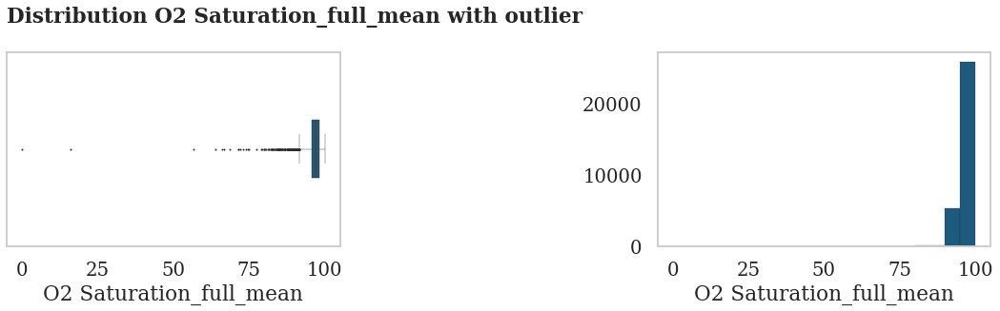

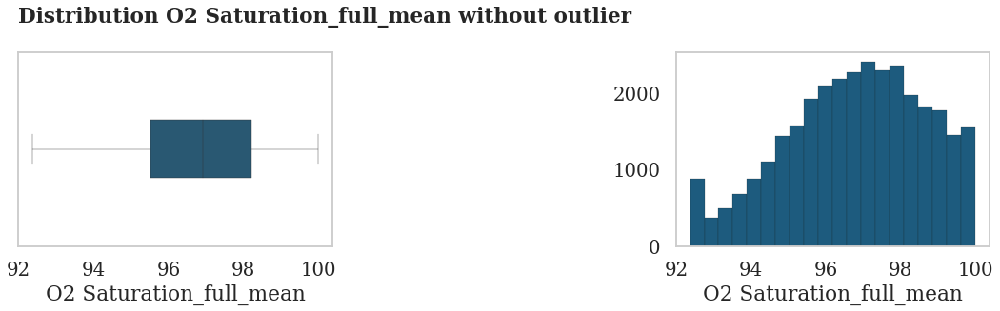

  6%|▌         | 1/17 [00:02<00:40,  2.55s/it]

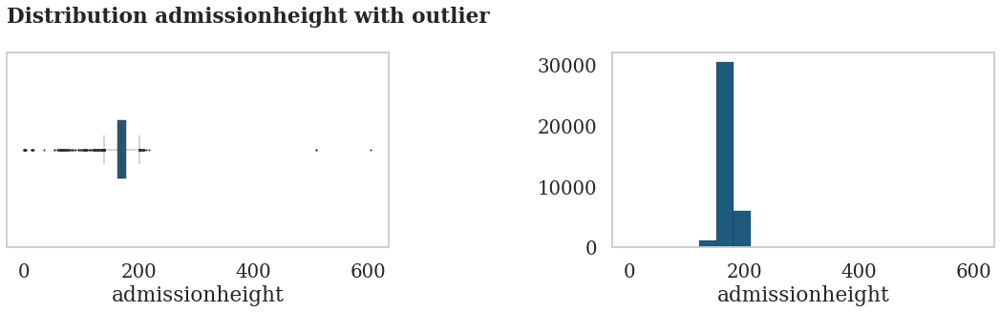

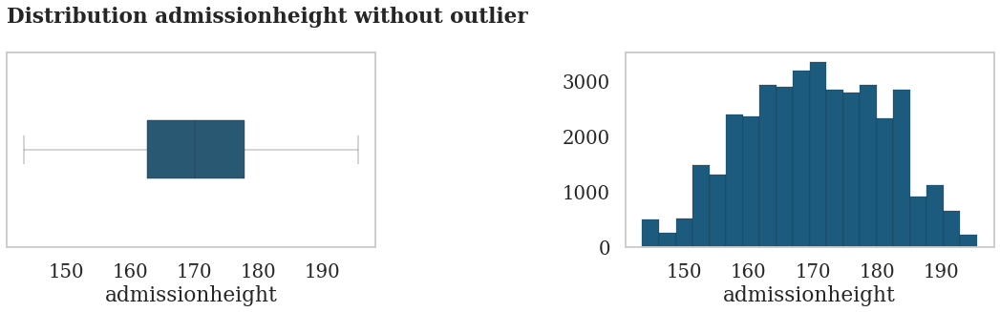

 12%|█▏        | 2/17 [00:07<00:50,  3.35s/it]

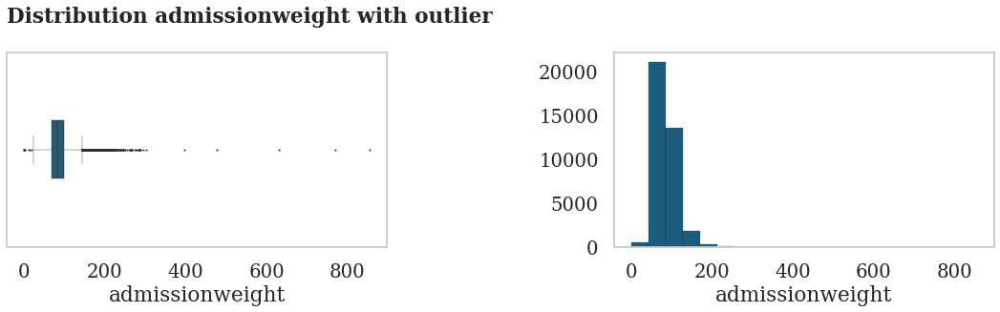

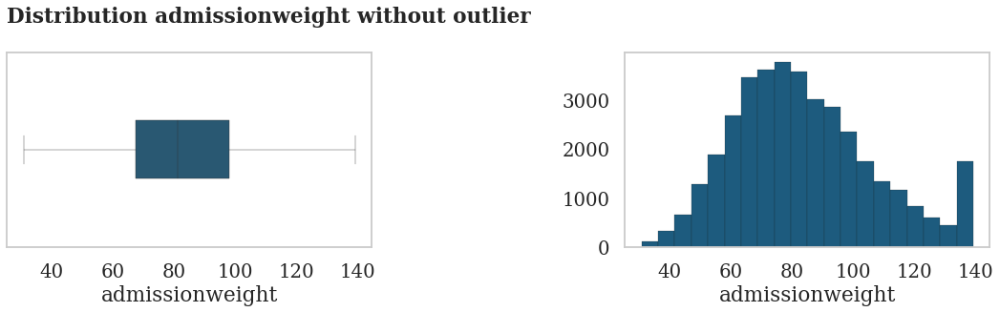

 18%|█▊        | 3/17 [00:10<00:44,  3.17s/it]

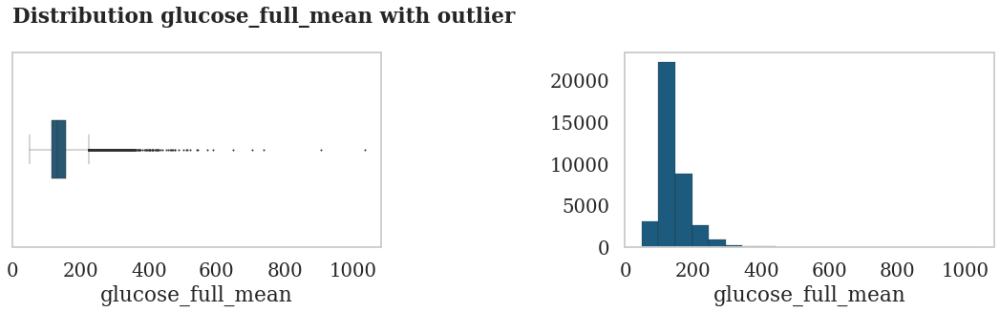

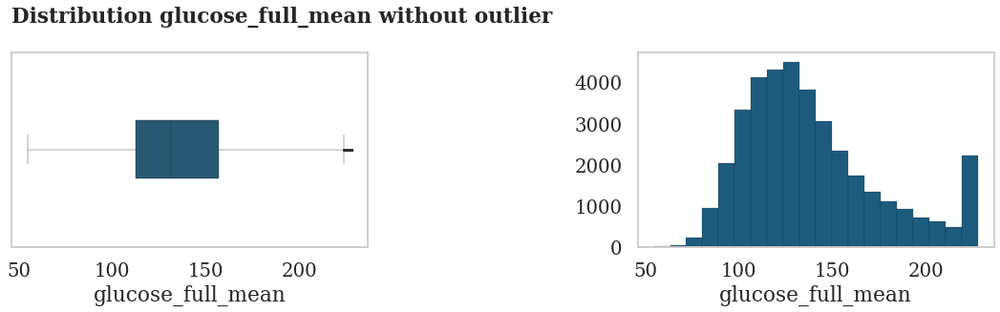

 24%|██▎       | 4/17 [00:13<00:40,  3.09s/it]

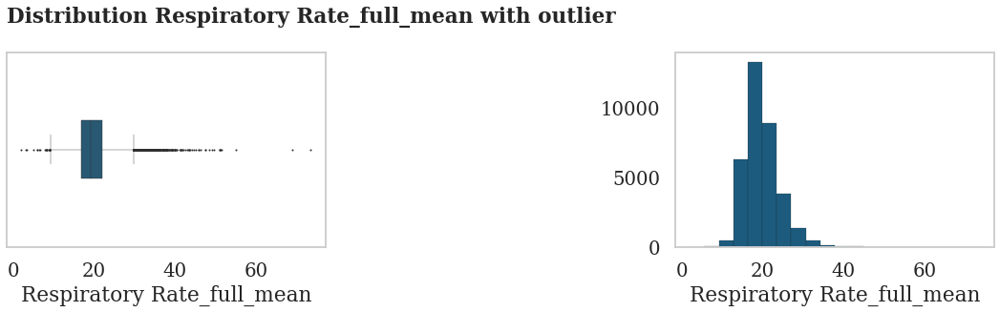

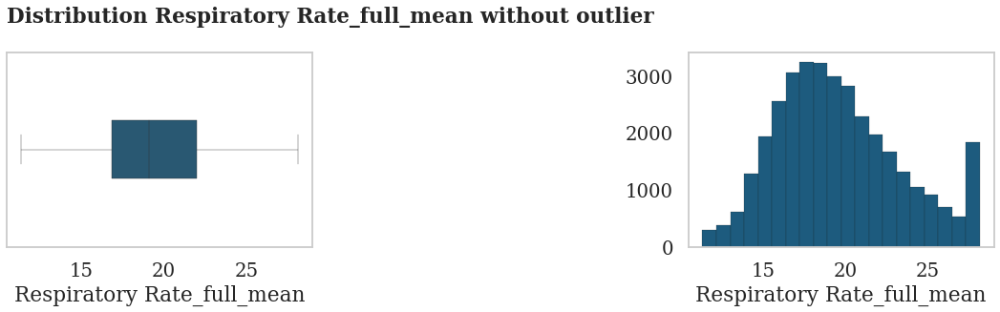

 29%|██▉       | 5/17 [00:16<00:35,  2.94s/it]

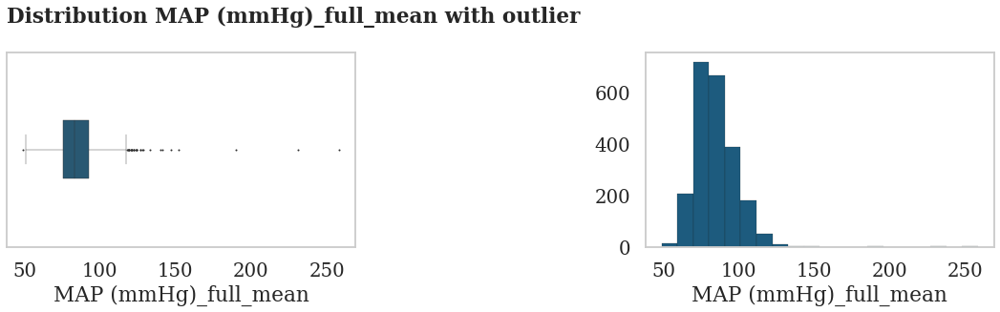

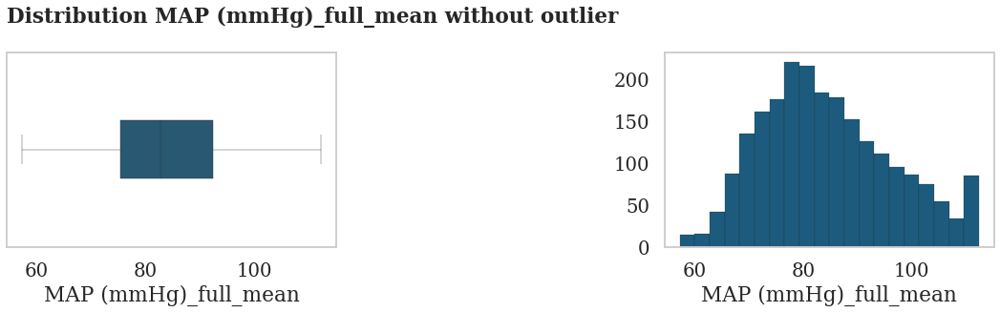

 35%|███▌      | 6/17 [00:18<00:31,  2.82s/it]

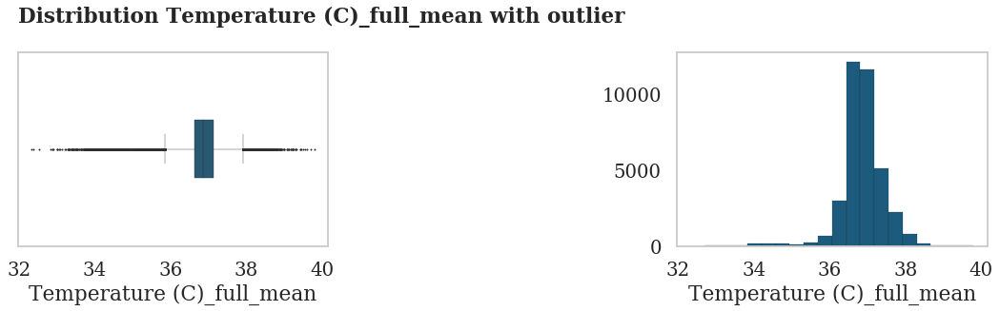

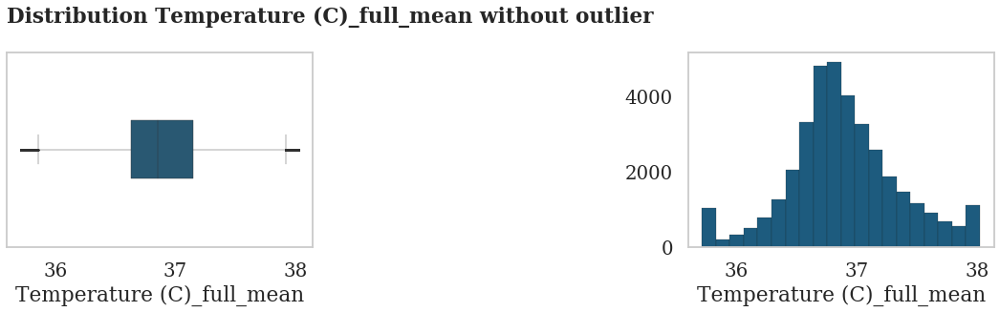

 41%|████      | 7/17 [00:21<00:27,  2.74s/it]

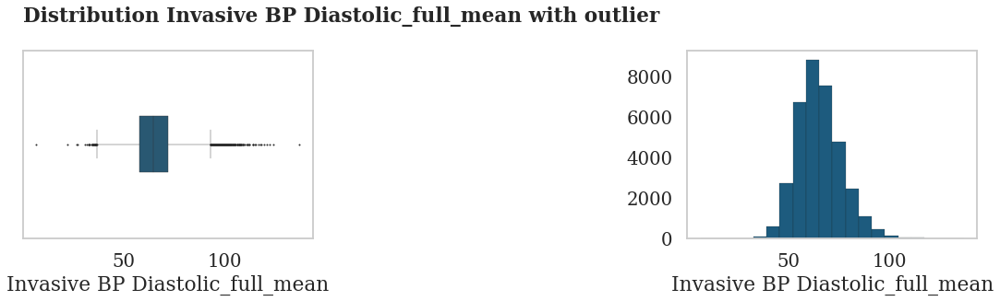

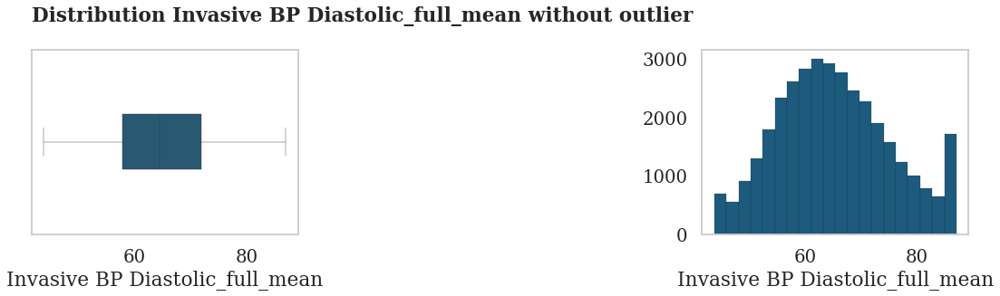

 47%|████▋     | 8/17 [00:23<00:24,  2.72s/it]

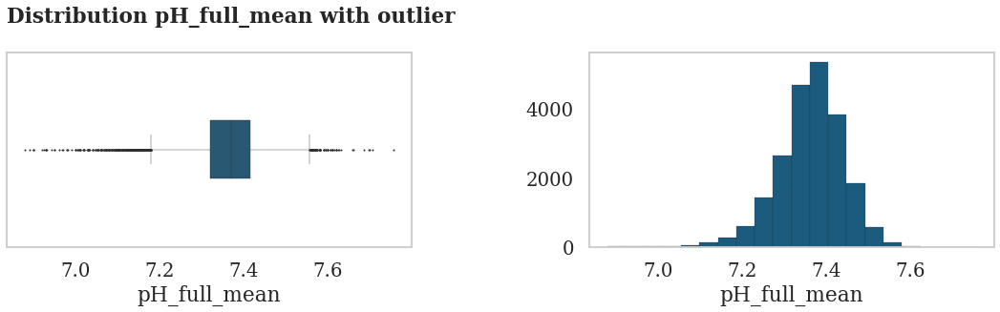

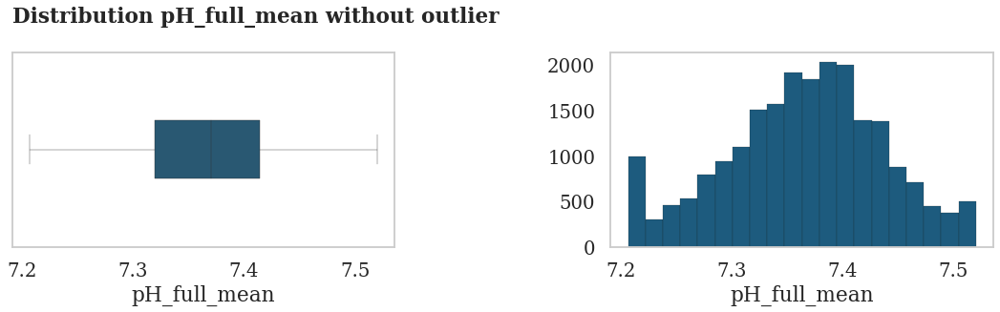

 53%|█████▎    | 9/17 [00:26<00:21,  2.68s/it]

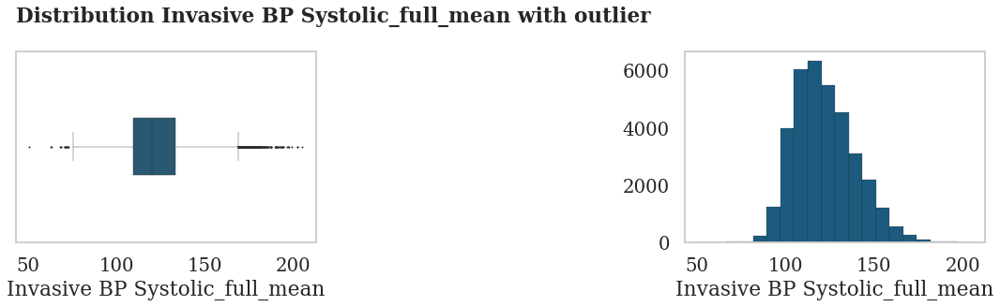

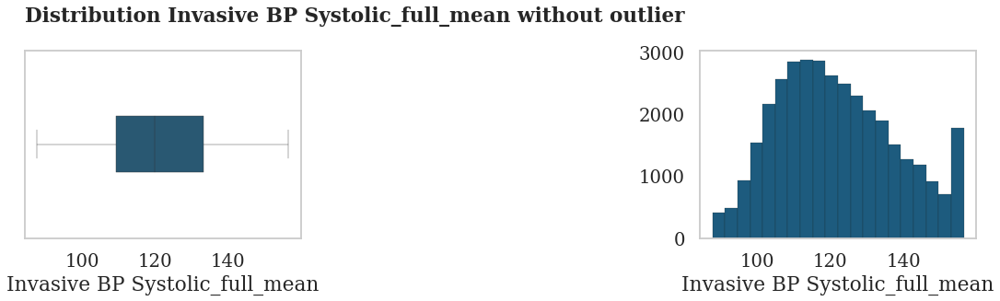

 59%|█████▉    | 10/17 [00:28<00:18,  2.66s/it]

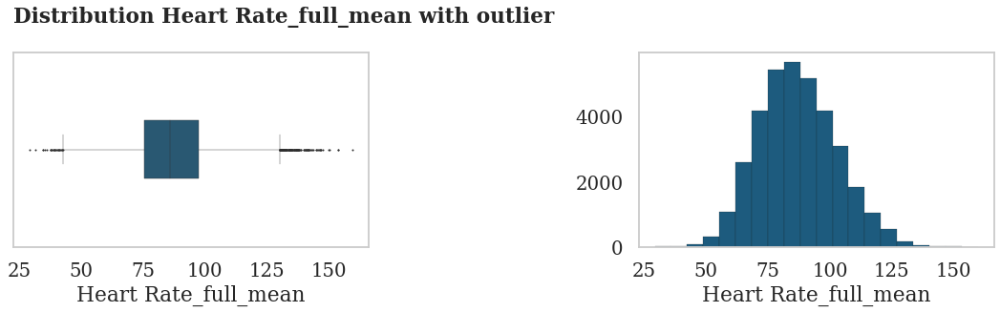

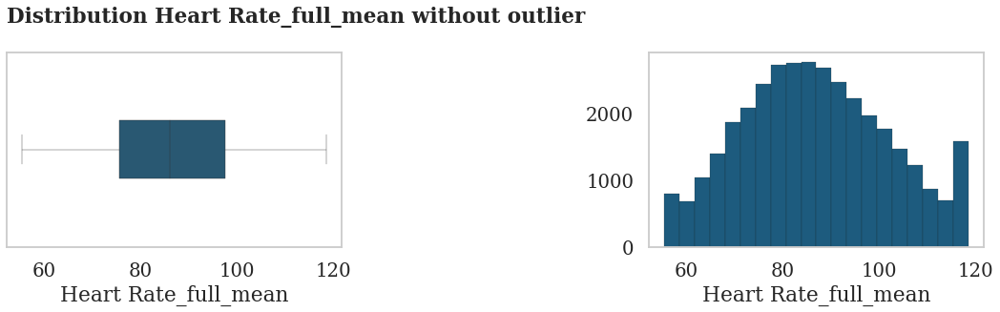

 65%|██████▍   | 11/17 [00:31<00:15,  2.67s/it]

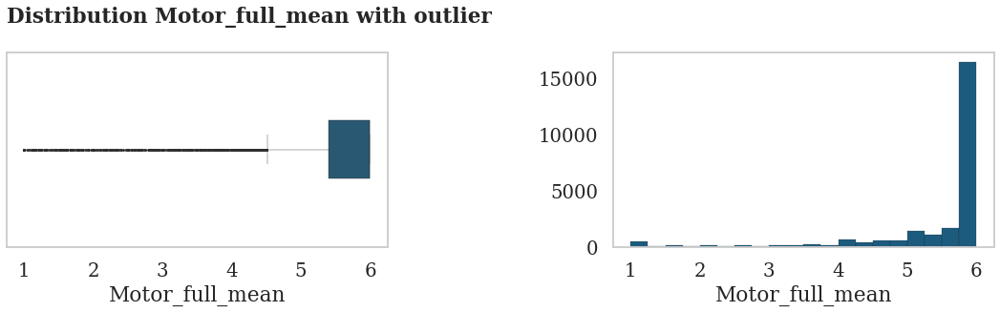

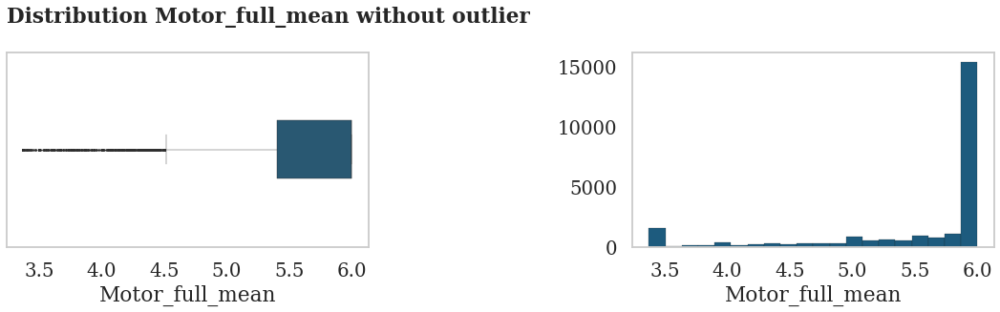

 71%|███████   | 12/17 [00:34<00:13,  2.69s/it]

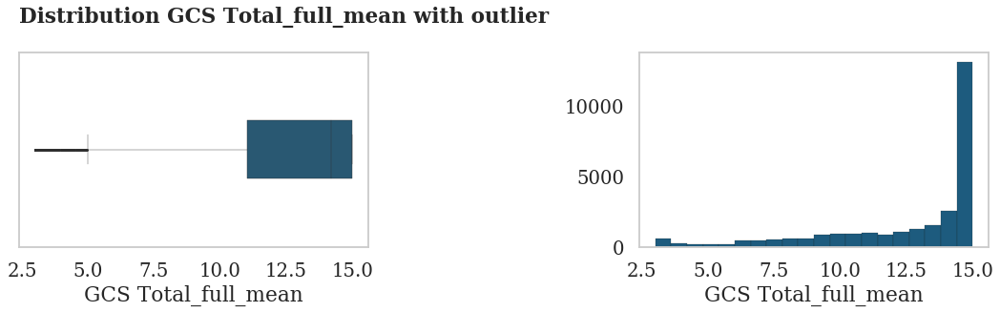

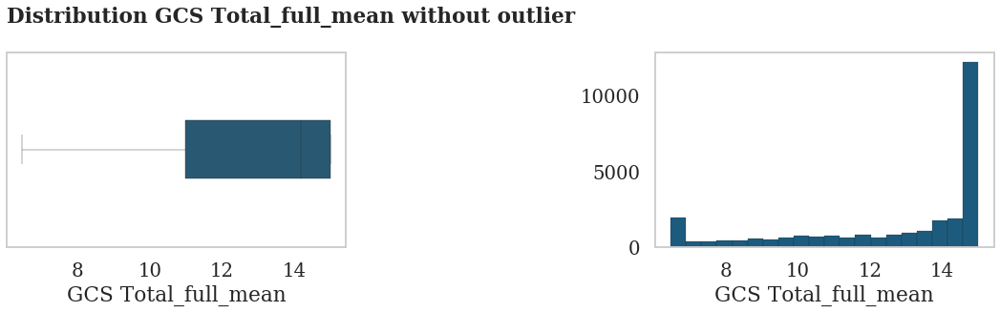

 76%|███████▋  | 13/17 [00:37<00:10,  2.69s/it]

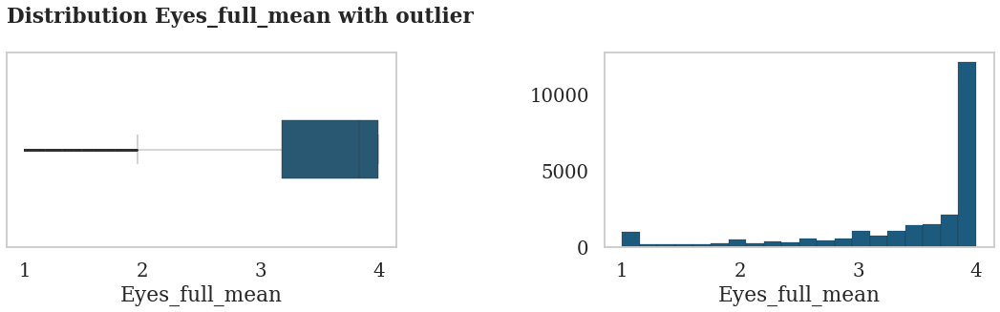

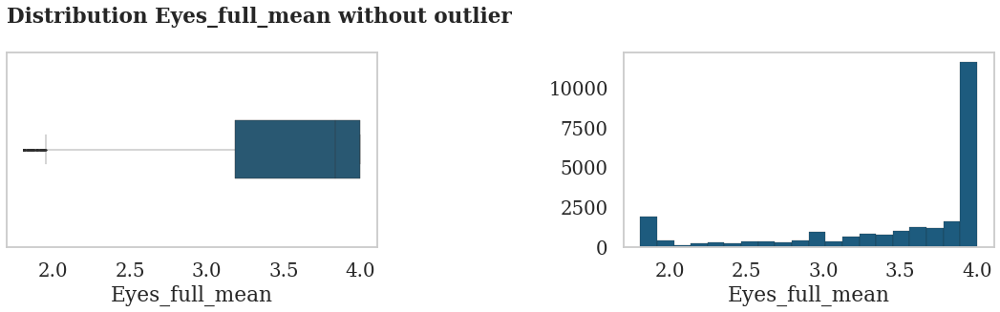

 82%|████████▏ | 14/17 [00:39<00:08,  2.67s/it]

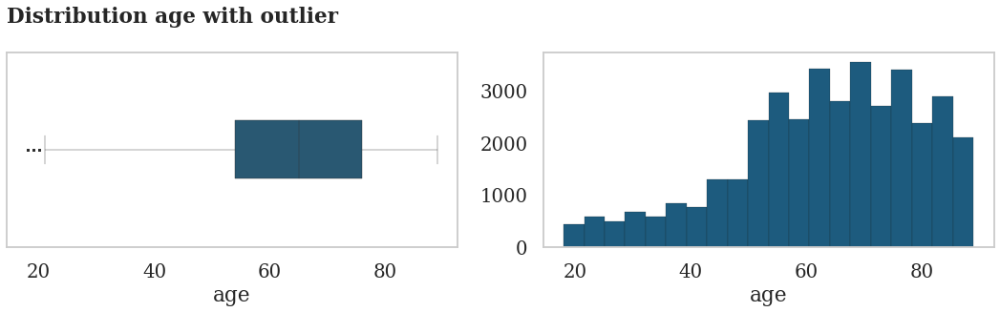

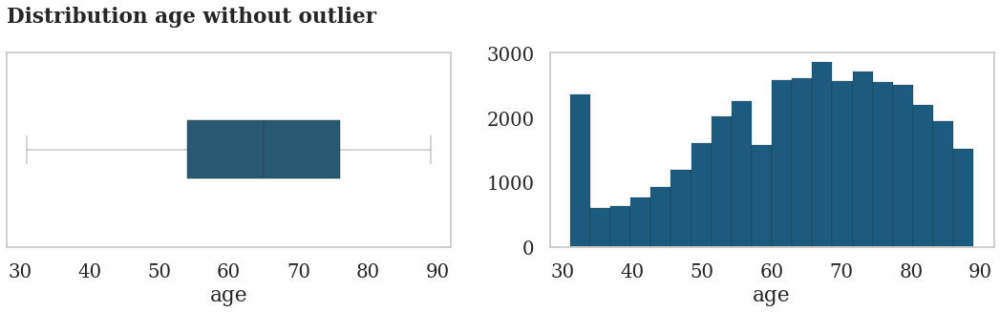

 88%|████████▊ | 15/17 [00:42<00:05,  2.69s/it]

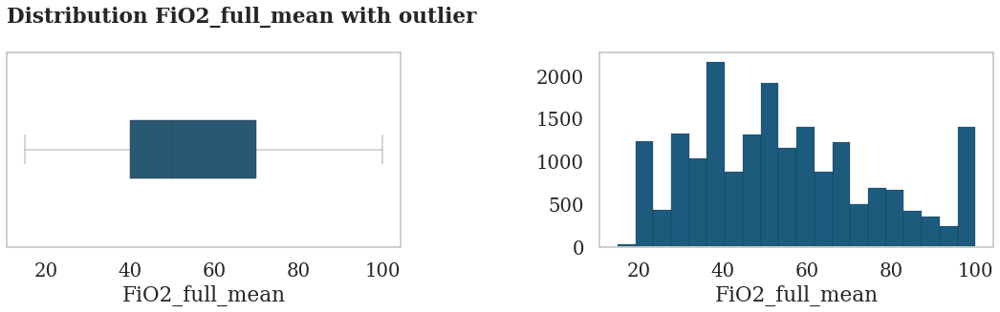

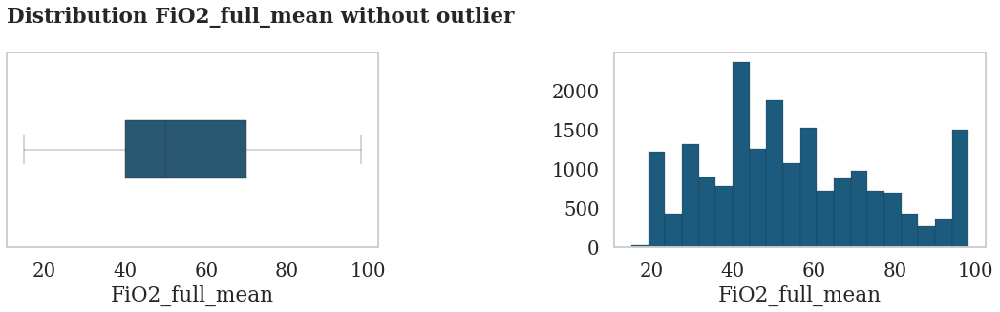

 94%|█████████▍| 16/17 [00:45<00:02,  2.65s/it]

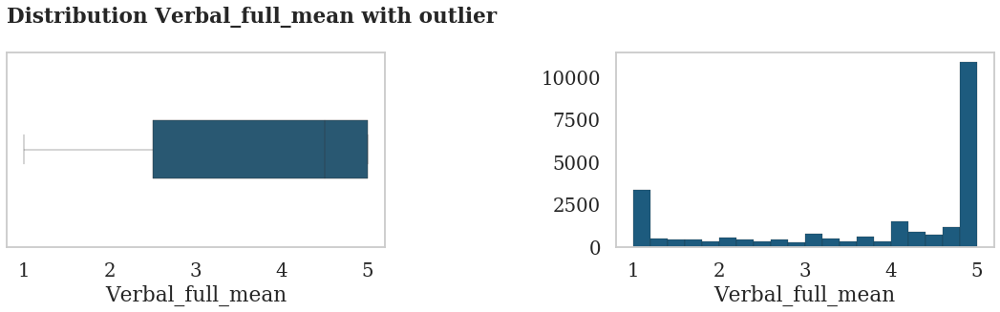

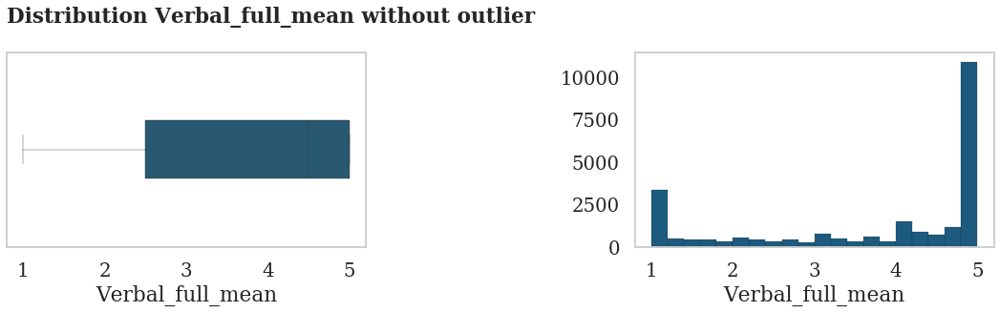

100%|██████████| 17/17 [00:48<00:00,  2.85s/it]


In [144]:
analyzer.analyze_data_quality()

  0%|          | 0/1 [00:00<?, ?it/s]

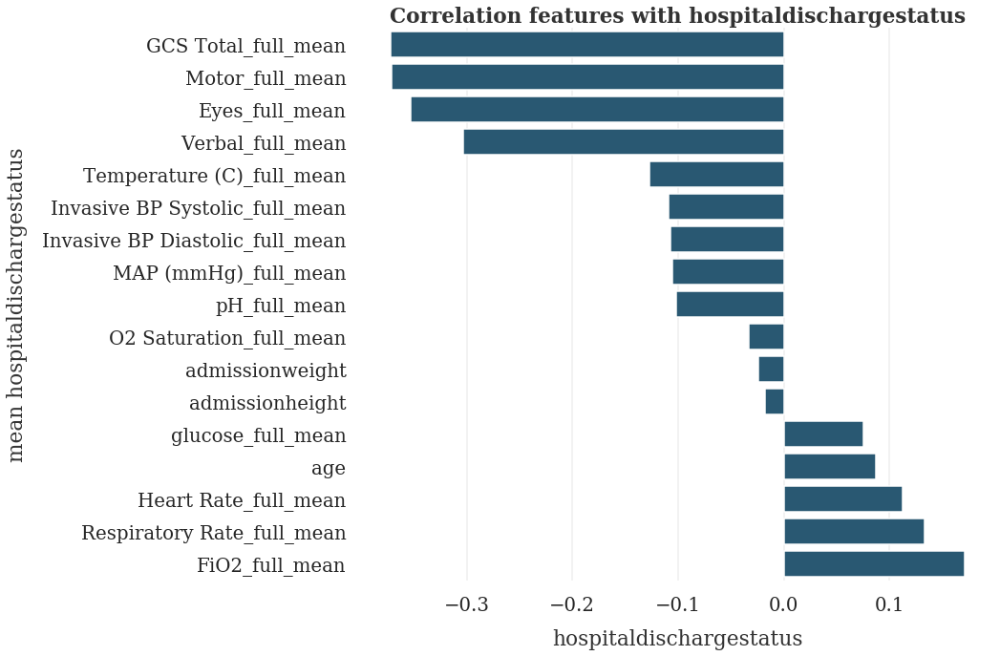

100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


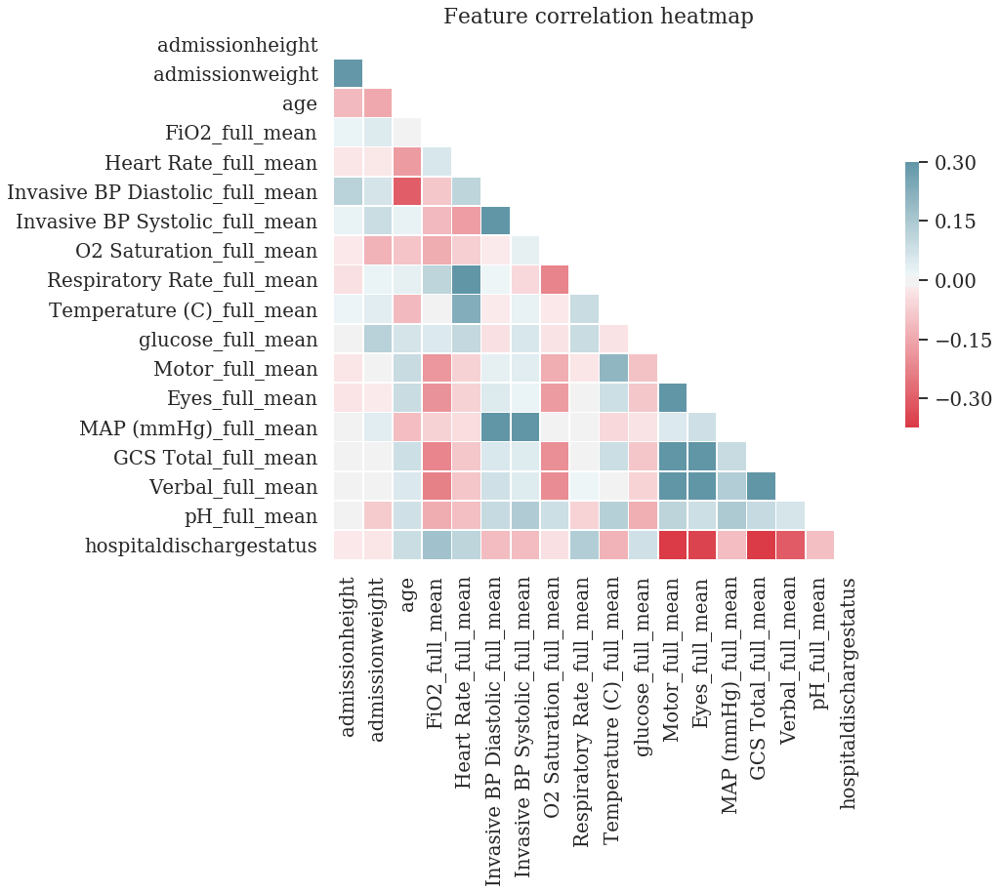

,admissionheight,admissionweight,age,FiO2_full_mean,Heart Rate_full_mean,Invasive BP Diastolic_full_mean,Invasive BP Systolic_full_mean,O2 Saturation_full_mean,Respiratory Rate_full_mean,Temperature (C)_full_mean,glucose_full_mean,Motor_full_mean,Eyes_full_mean,MAP (mmHg)_full_mean,GCS Total_full_mean,Verbal_full_mean,pH_full_mean,hospitaldischargestatus
admissionheight,1,0.29,-0.11,0.021,-0.024,0.12,0.025,-0.018,-0.038,0.018,-0.01,-0.024,-0.026,0.013,-0.013,-0.00072,0.0051,-0.018
admissionweight,0.29,1,-0.15,0.047,-0.021,0.067,0.088,-0.13,0.023,0.041,0.12,-0.0062,-0.017,0.043,-0.0045,0.0096,-0.076,-0.024
age,-0.11,-0.15,1,-0.0013,-0.17,-0.3,0.03,-0.092,0.032,-0.11,0.067,0.095,0.091,-0.11,0.083,0.056,0.076,0.087
FiO2_full_mean,0.021,0.047,-0.0013,1,0.06,-0.084,-0.11,-0.14,0.11,0.0083,0.05,-0.18,-0.19,-0.066,-0.22,-0.23,-0.14,0.17
Heart Rate_full_mean,-0.024,-0.021,-0.17,0.06,1,0.11,-0.17,-0.071,0.3,0.23,0.1,-0.065,-0.066,-0.043,-0.084,-0.088,-0.1,0.11
Invasive BP Diastolic_full_mean,0.12,0.067,-0.3,-0.084,0.11,1,0.55,-0.015,0.016,-0.017,-0.032,0.031,0.046,0.74,0.058,0.076,0.097,-0.11
Invasive BP Systolic_full_mean,0.025,0.088,0.03,-0.11,-0.17,0.55,1,0.03,-0.05,0.028,0.06,0.043,0.024,0.66,0.043,0.045,0.14,-0.11
O2 Saturation_full_mean,-0.018,-0.13,-0.092,-0.14,-0.071,-0.015,0.03,1,-0.22,-0.02,-0.029,-0.14,-0.17,0.0042,-0.2,-0.21,0.084,-0.033
Respiratory Rate_full_mean,-0.038,0.023,0.032,0.11,0.3,0.016,-0.05,-0.22,1,0.091,0.091,-0.024,0.0067,-0.0087,-0.0036,0.016,-0.064,0.13
Temperature (C)_full_mean,0.018,0.041,-0.11,0.0083,0.23,-0.017,0.028,-0.02,0.091,1,-0.03,0.2,0.084,-0.05,0.085,-0.0015,0.13,-0.13


In [145]:
analyzer.analyze_correlations()

  0%|          | 0/17 [00:00<?, ?it/s]

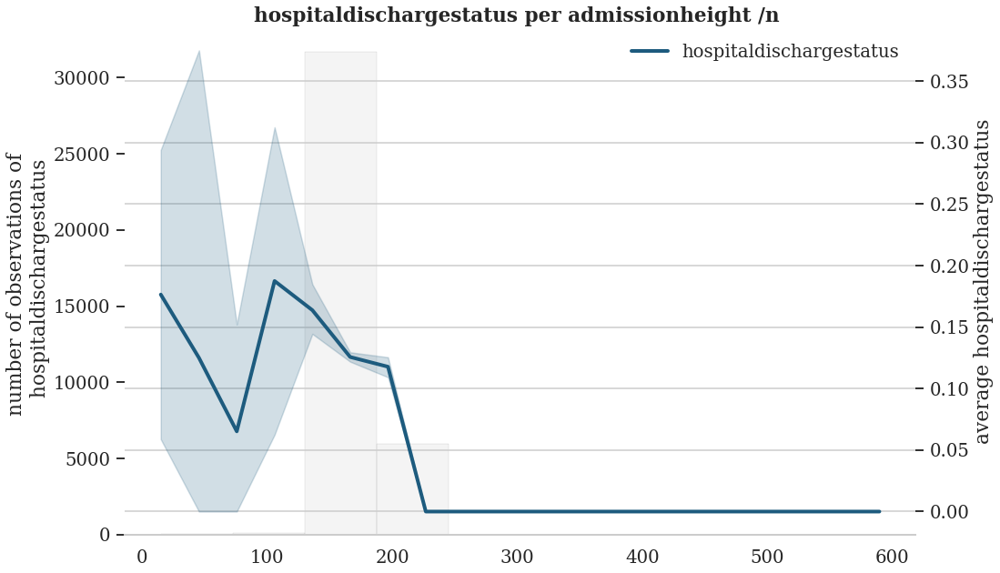

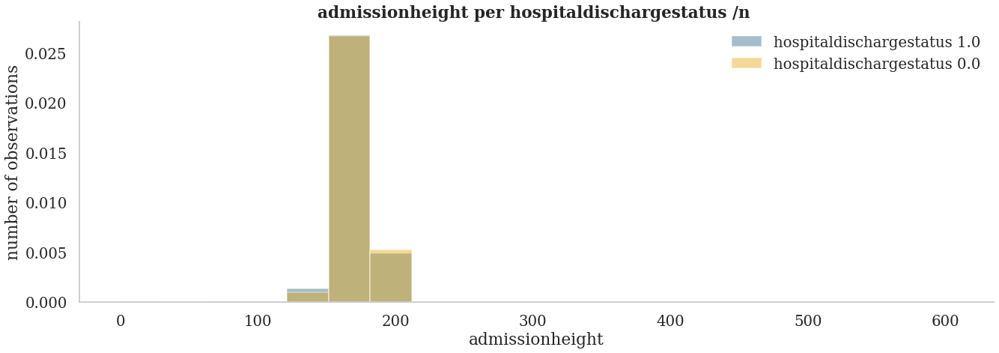

  6%|▌         | 1/17 [00:08<02:19,  8.70s/it]

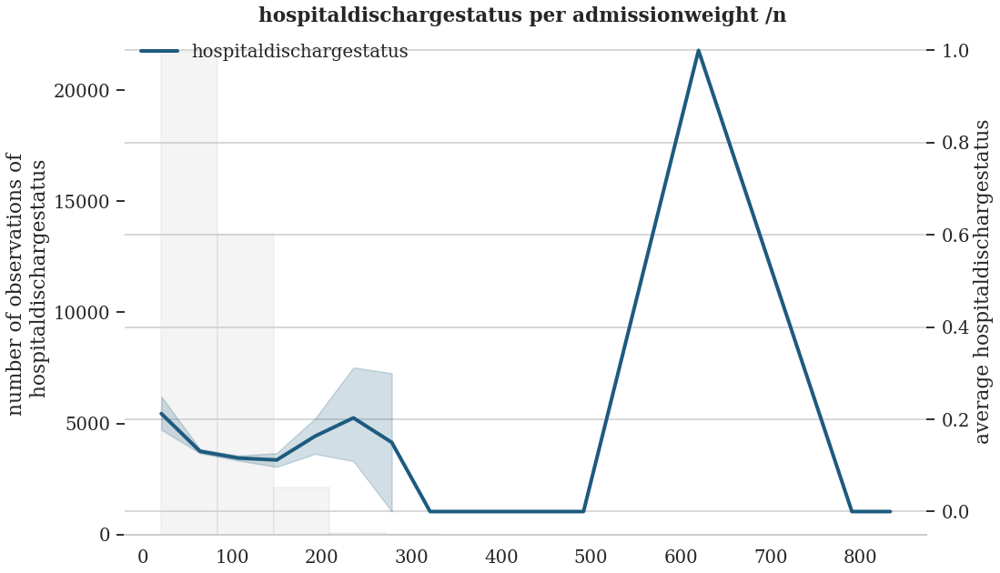

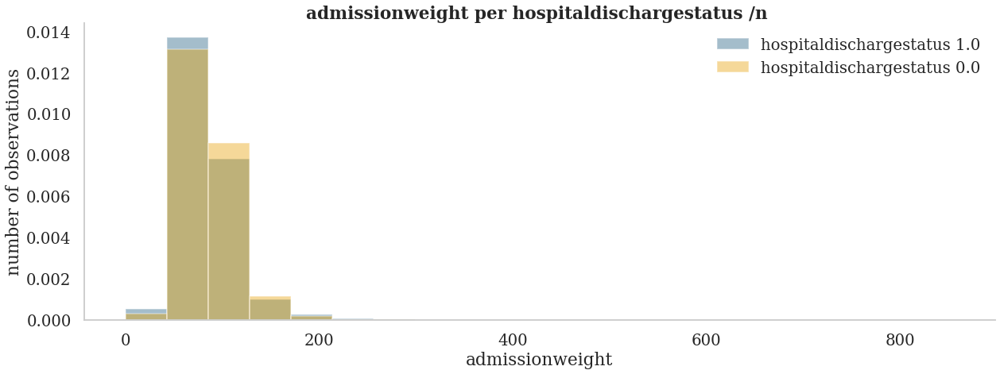

 12%|█▏        | 2/17 [00:17<02:09,  8.64s/it]

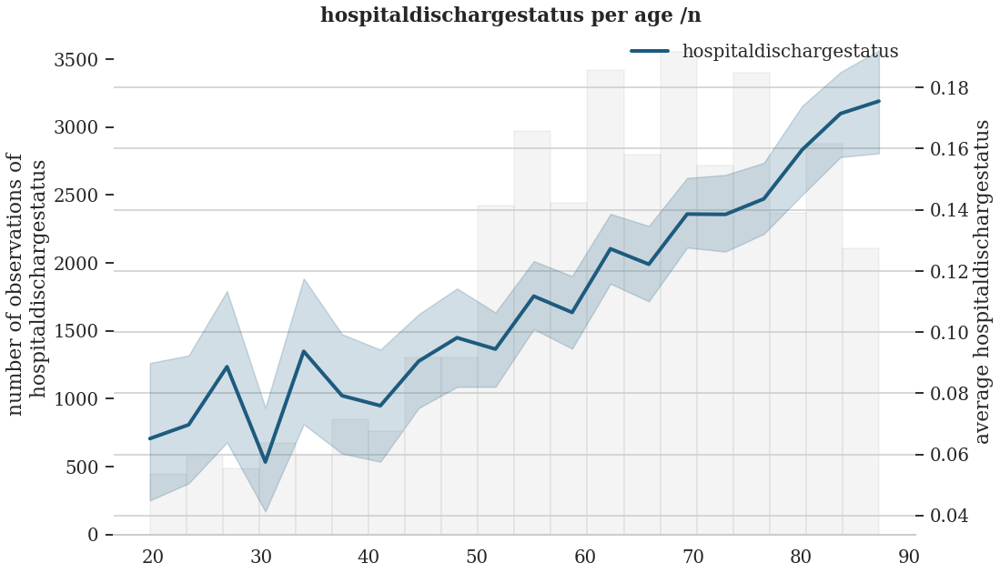

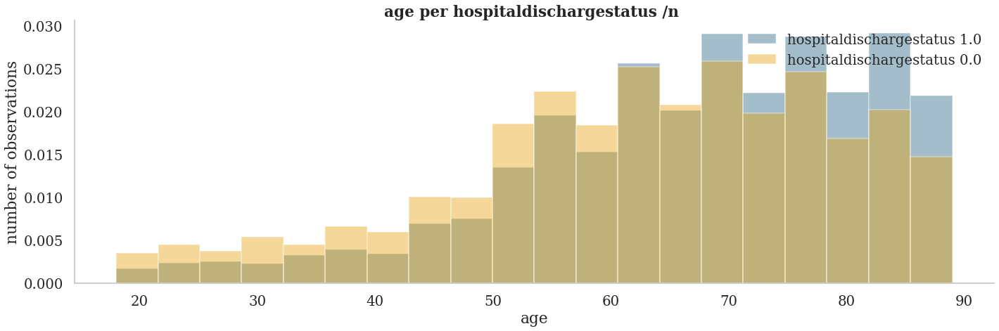

 18%|█▊        | 3/17 [00:26<02:04,  8.89s/it]

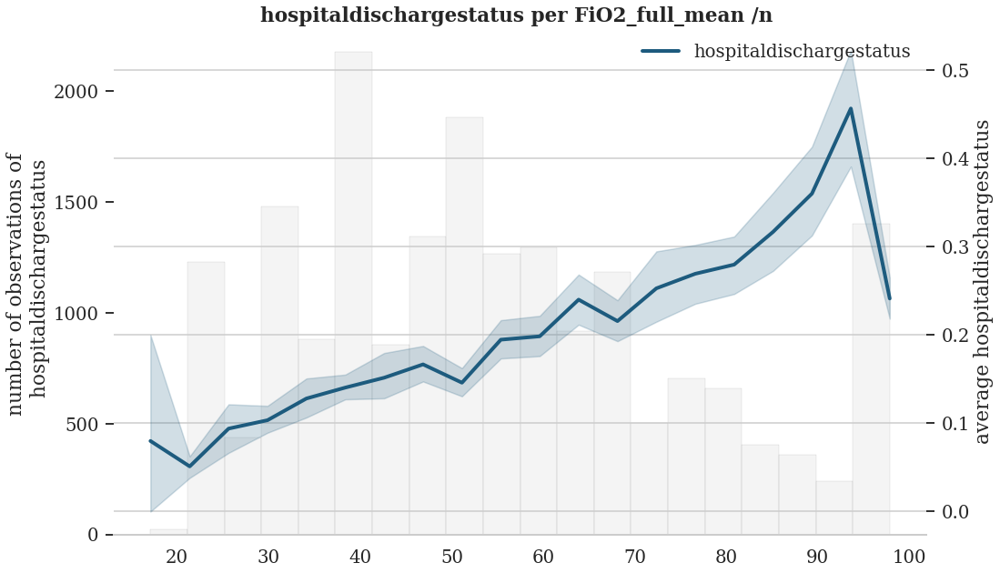

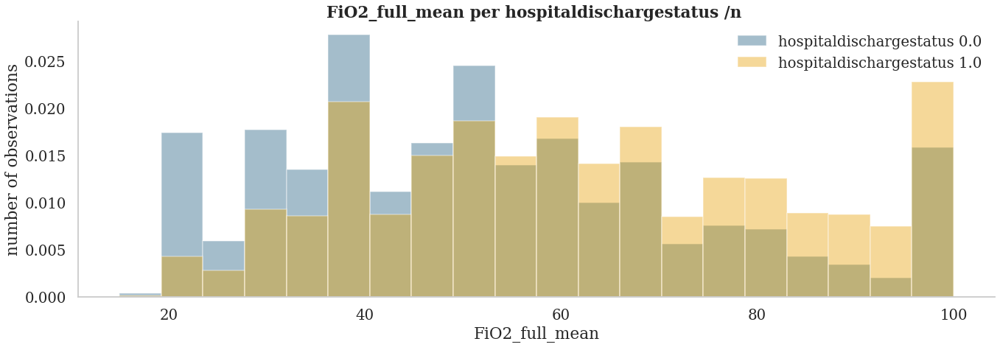

 24%|██▎       | 4/17 [00:33<01:46,  8.18s/it]

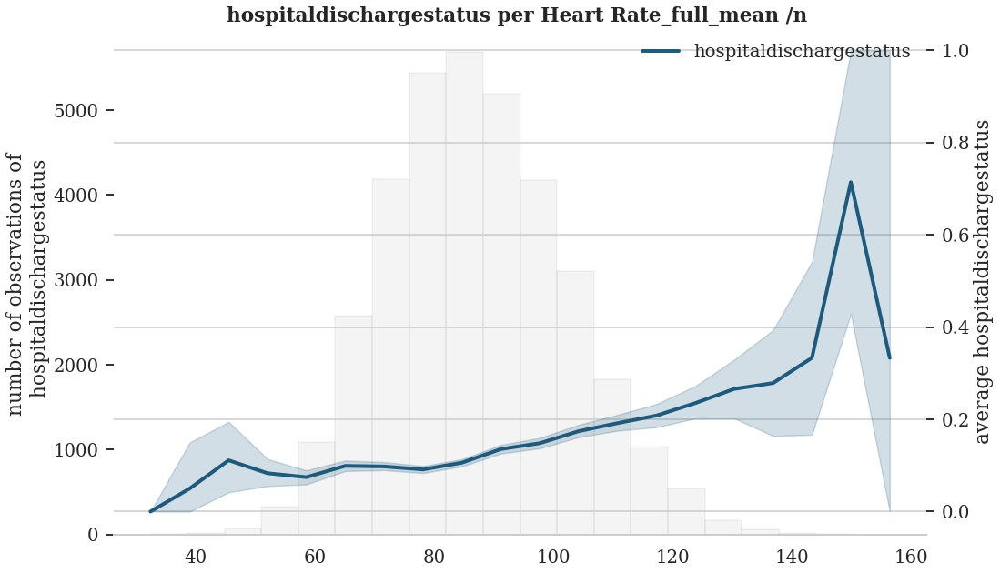

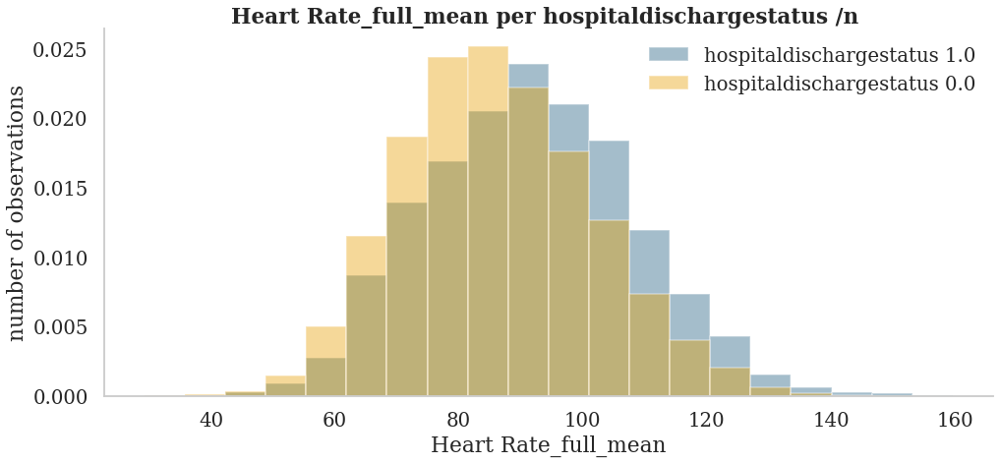

 29%|██▉       | 5/17 [00:41<01:39,  8.33s/it]

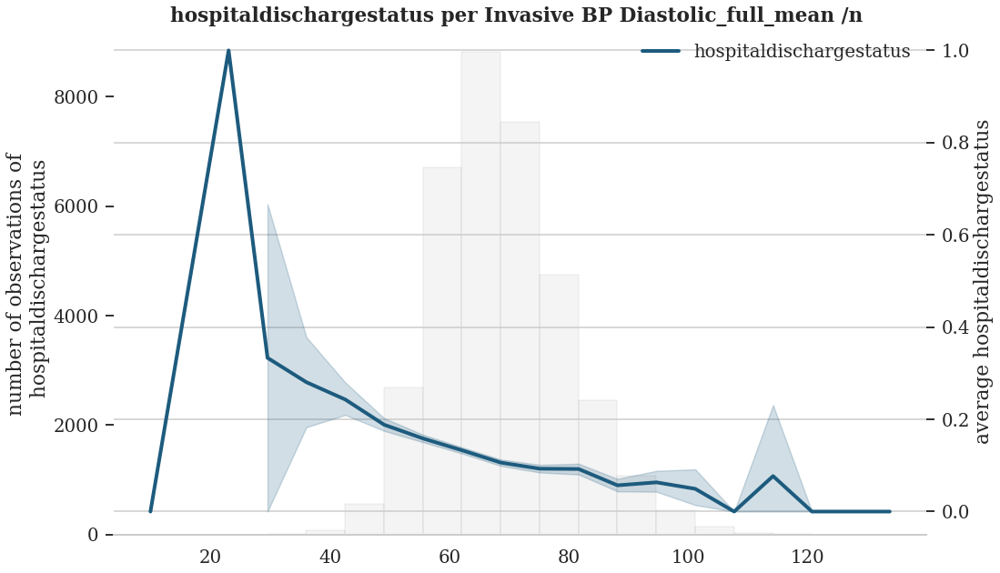

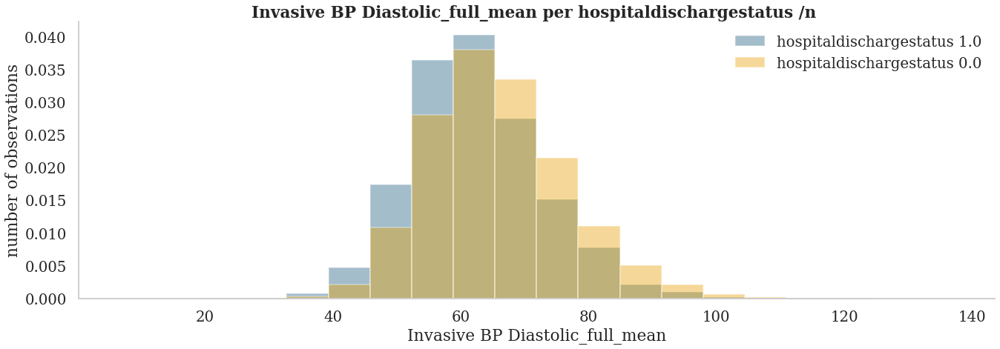

 35%|███▌      | 6/17 [00:50<01:32,  8.43s/it]

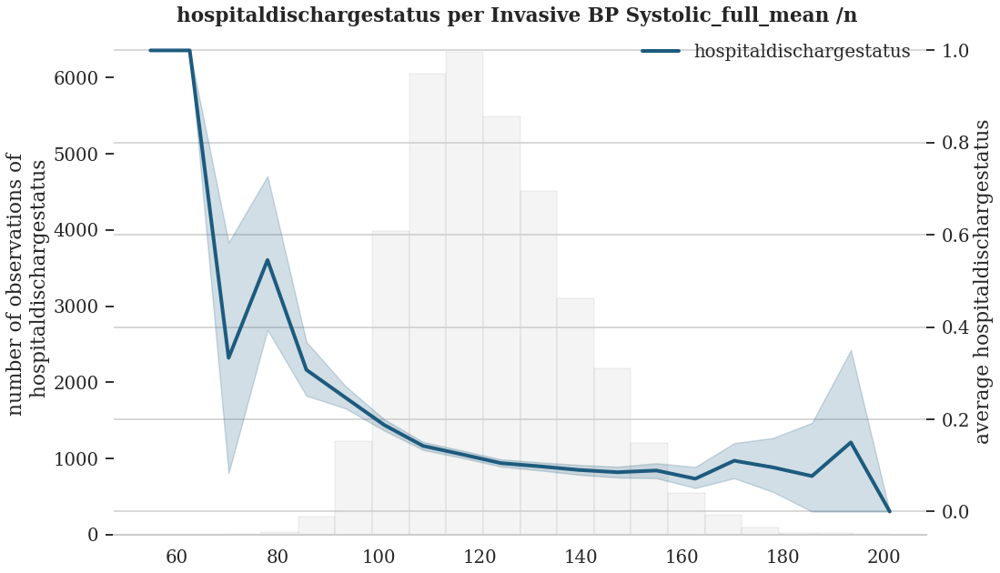

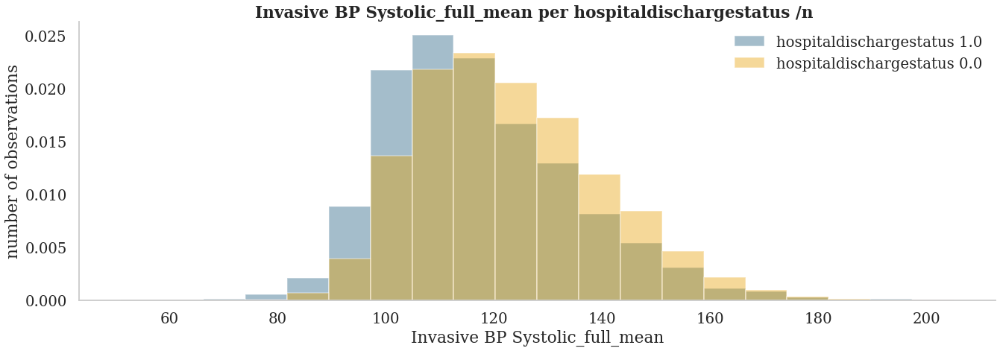

 41%|████      | 7/17 [00:59<01:26,  8.62s/it]

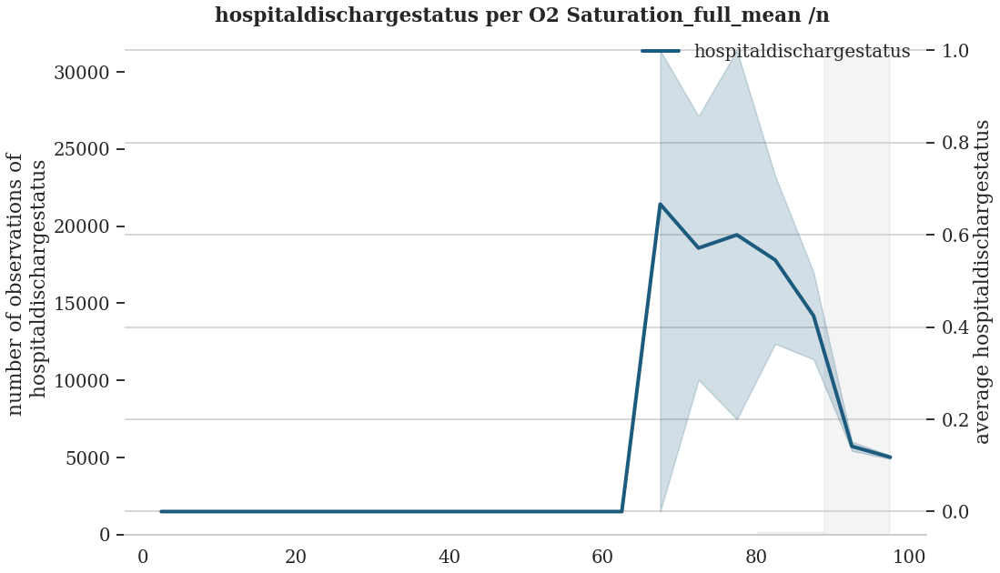

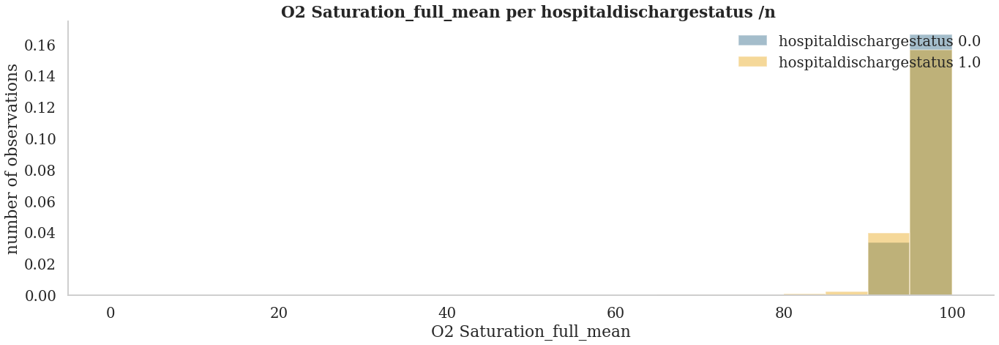

 47%|████▋     | 8/17 [01:07<01:15,  8.38s/it]

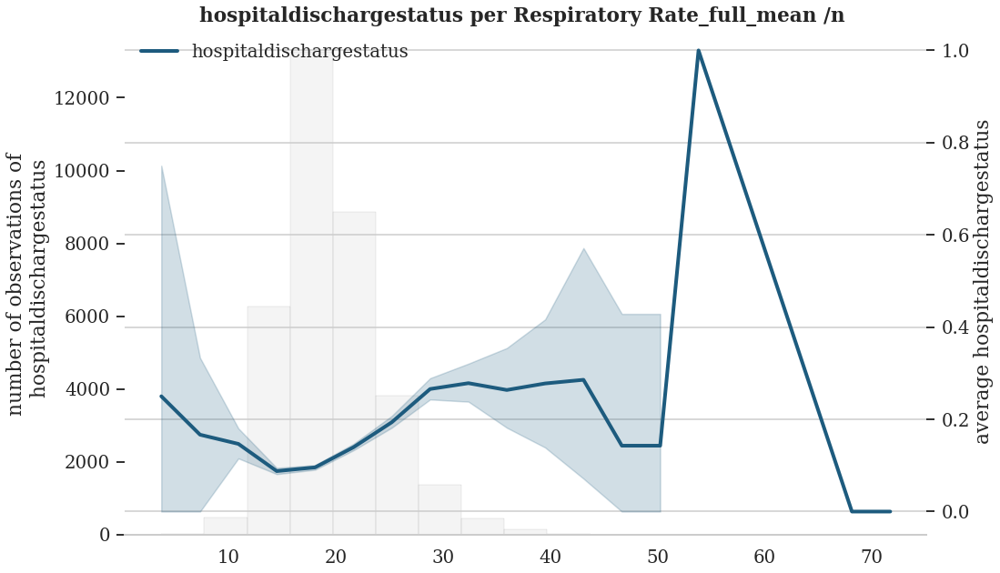

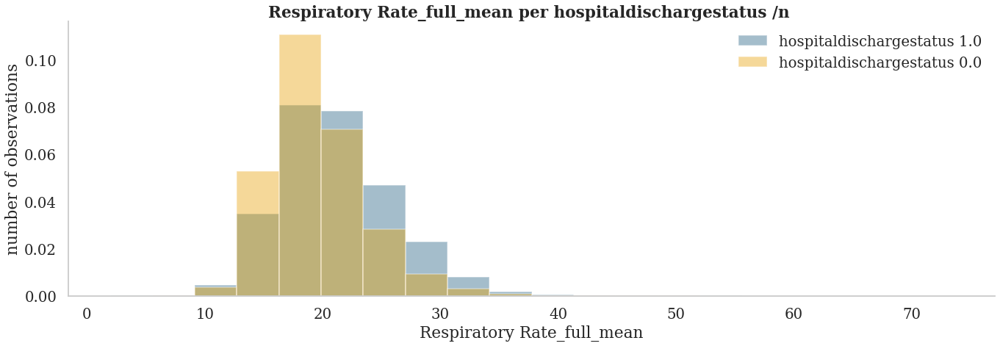

 53%|█████▎    | 9/17 [01:15<01:07,  8.41s/it]

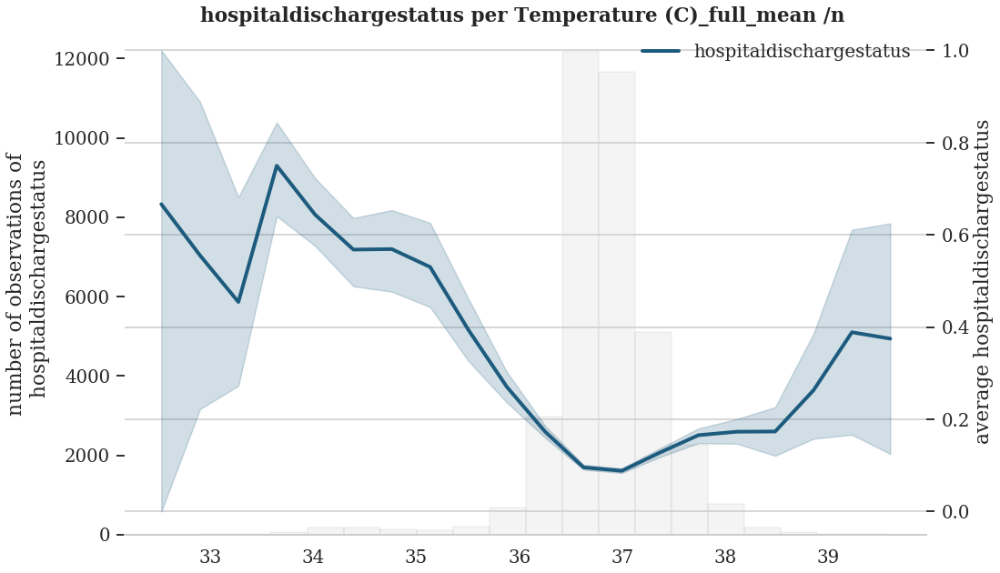

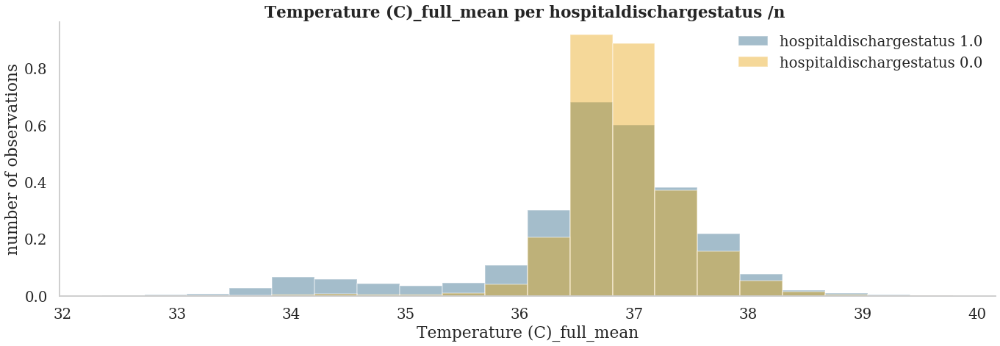

 59%|█████▉    | 10/17 [01:25<01:00,  8.64s/it]

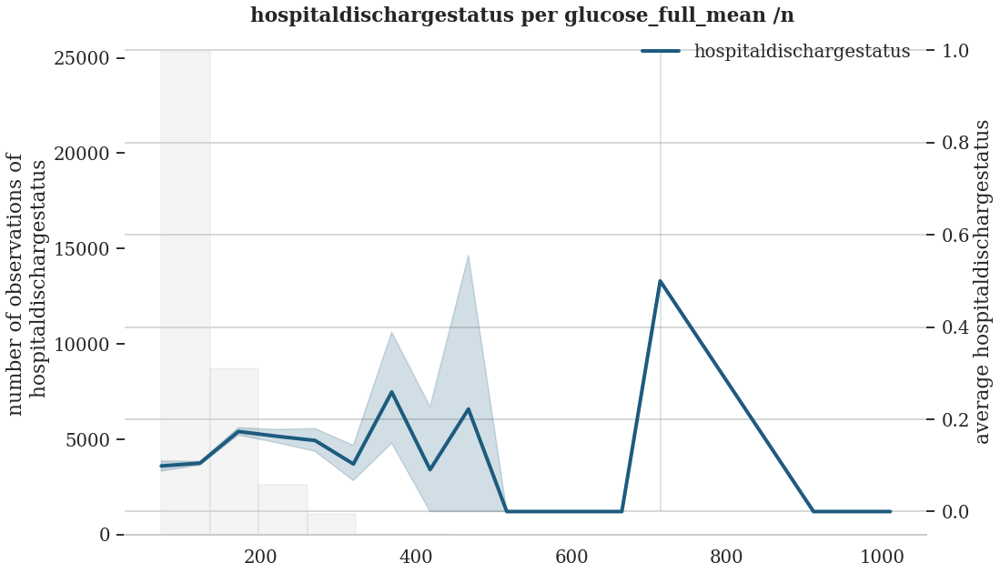

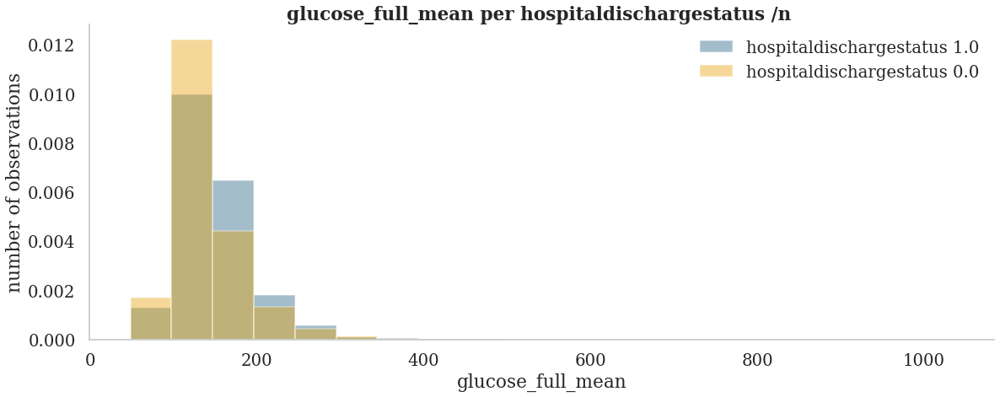

 65%|██████▍   | 11/17 [01:34<00:52,  8.75s/it]

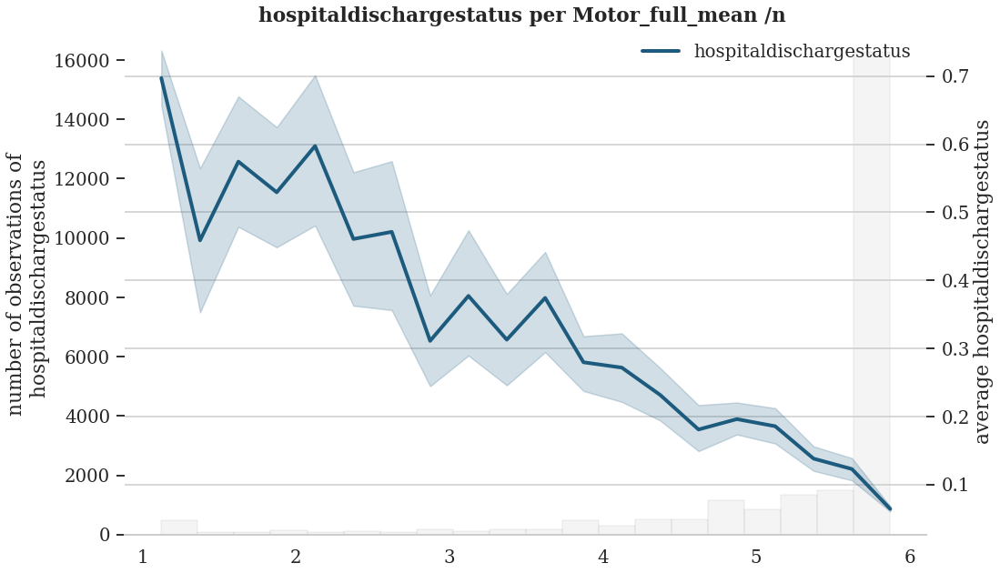

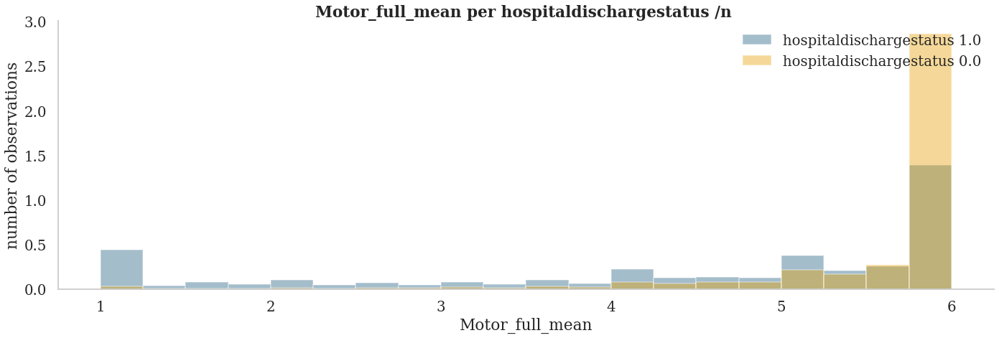

 71%|███████   | 12/17 [01:41<00:41,  8.24s/it]

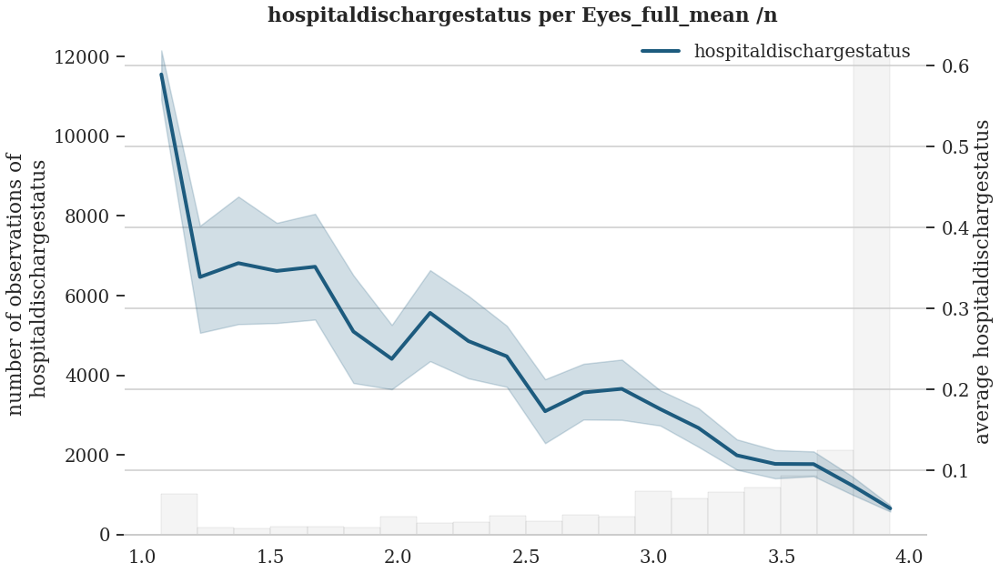

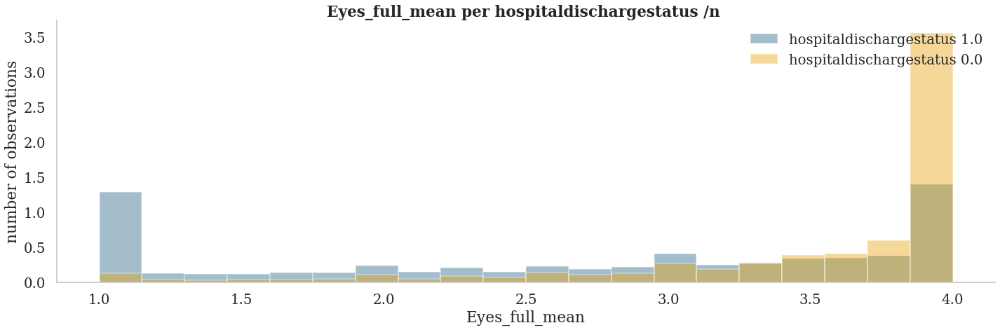

 76%|███████▋  | 13/17 [01:48<00:31,  7.88s/it]

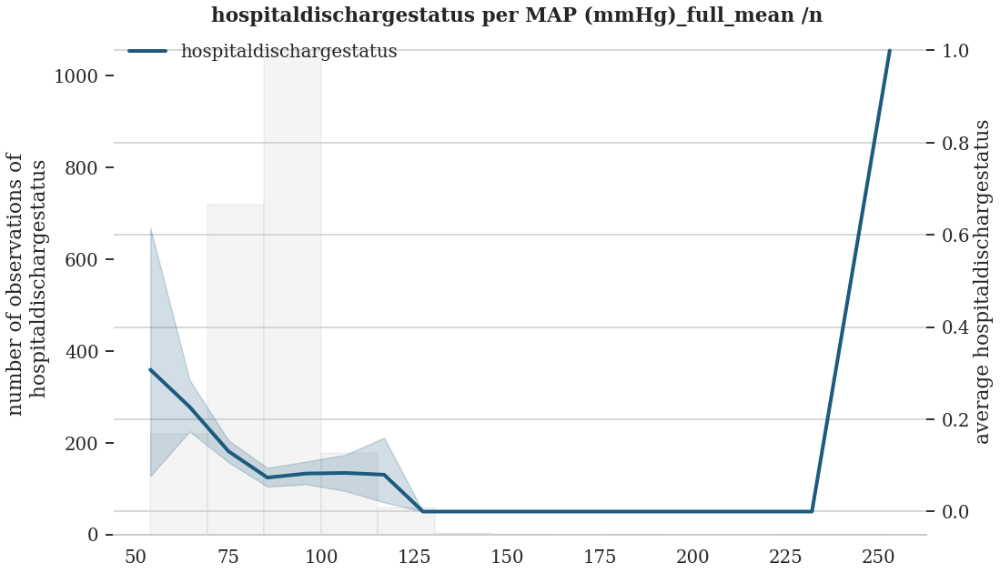

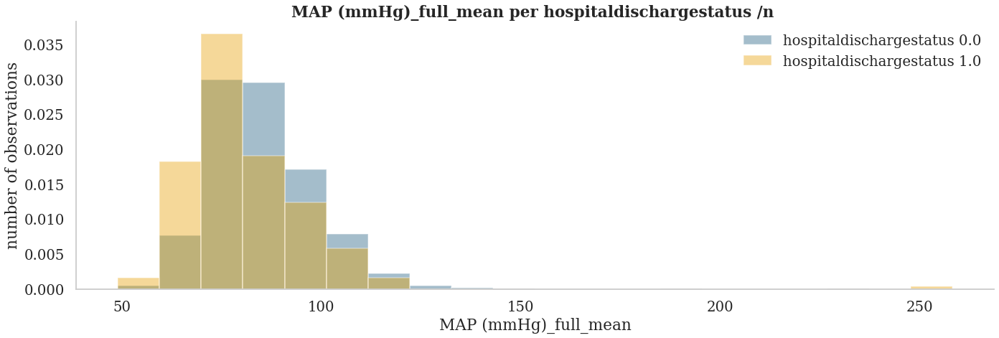

 82%|████████▏ | 14/17 [01:52<00:20,  6.75s/it]

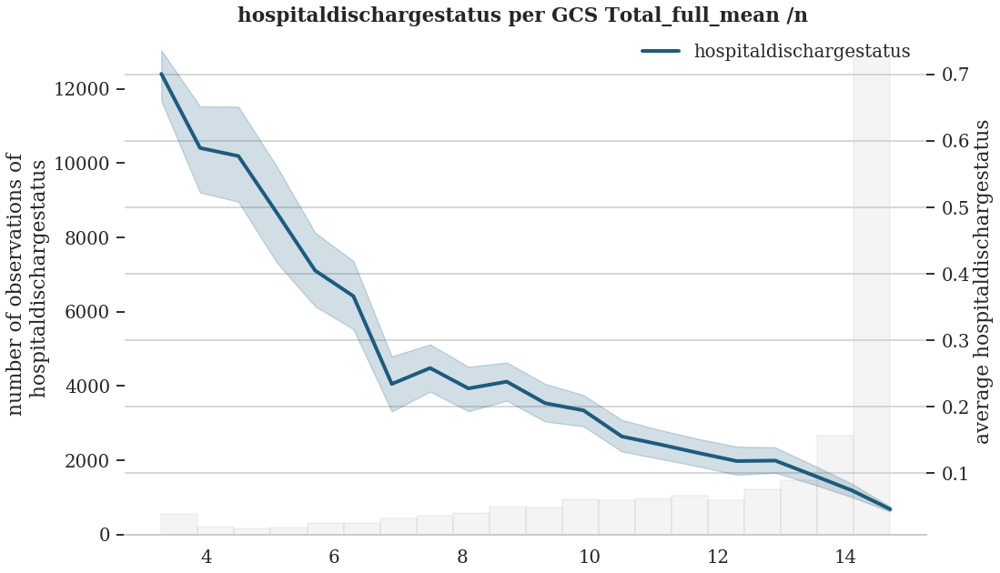

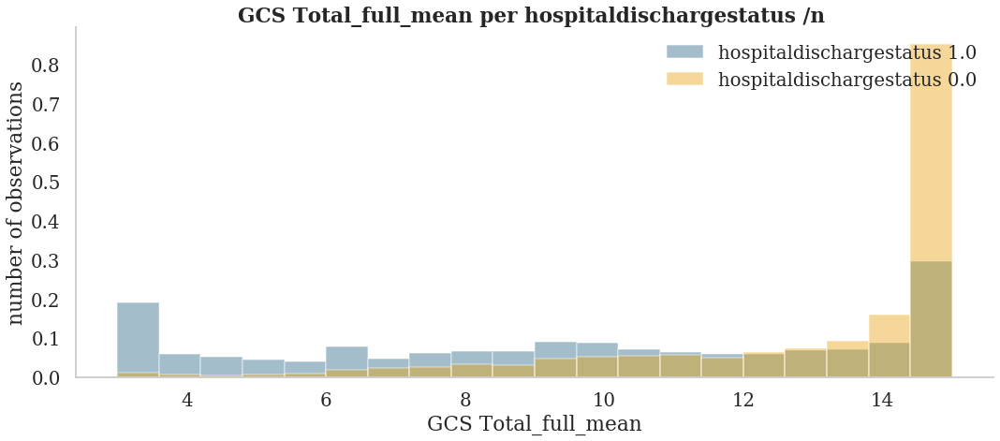

 88%|████████▊ | 15/17 [01:59<00:13,  6.96s/it]

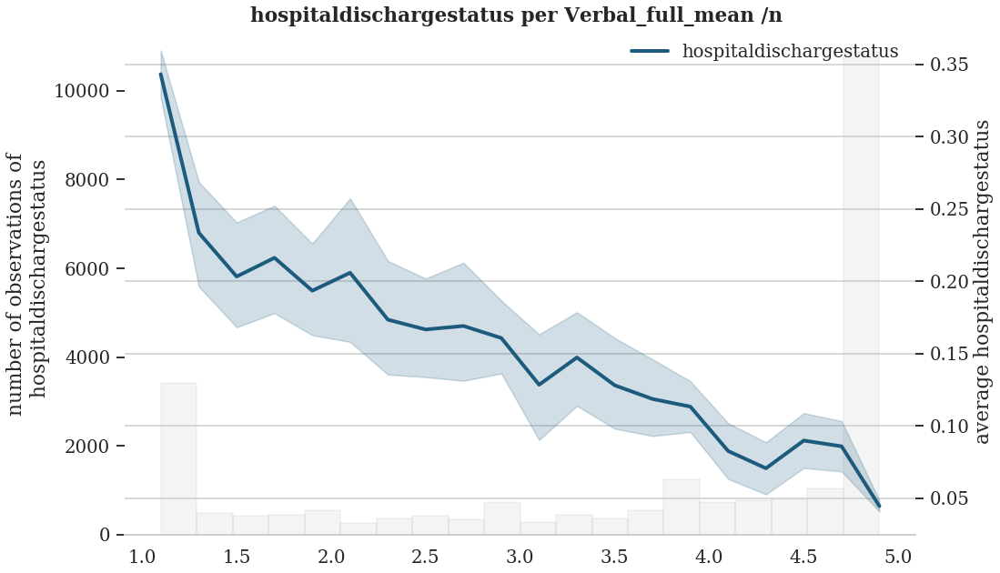

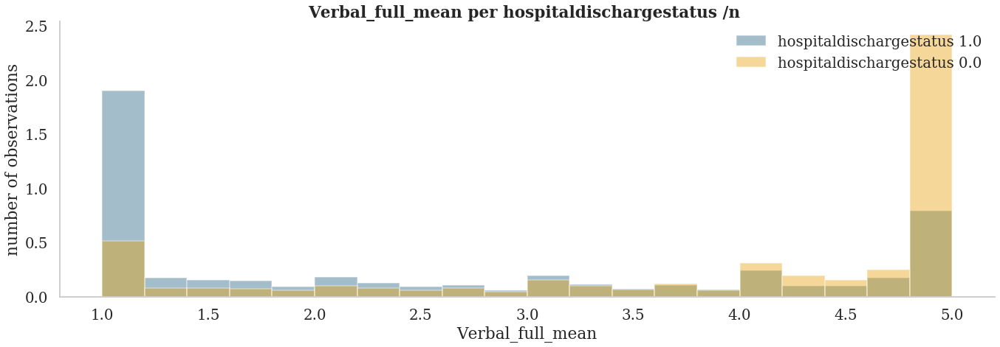

 94%|█████████▍| 16/17 [02:07<00:07,  7.24s/it]

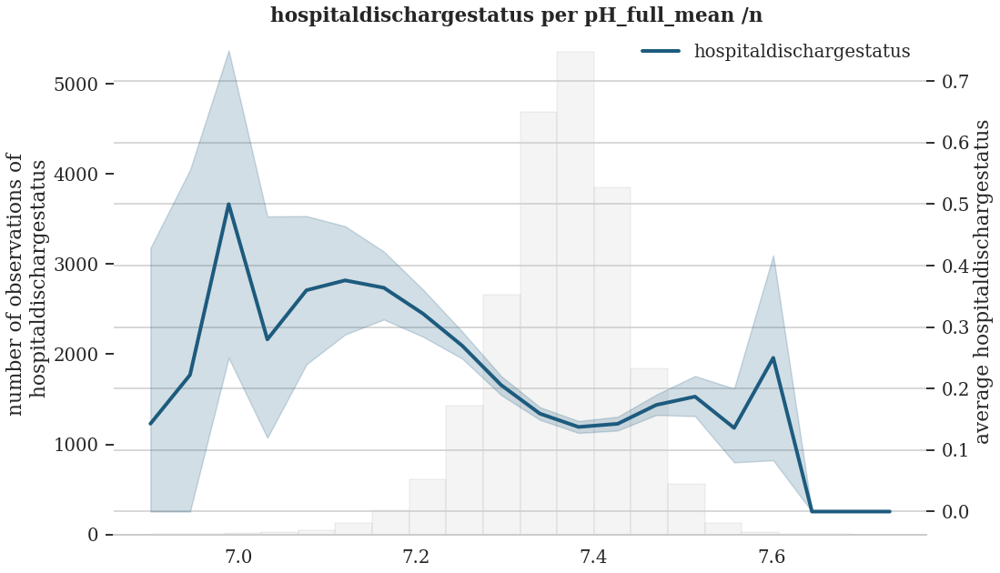

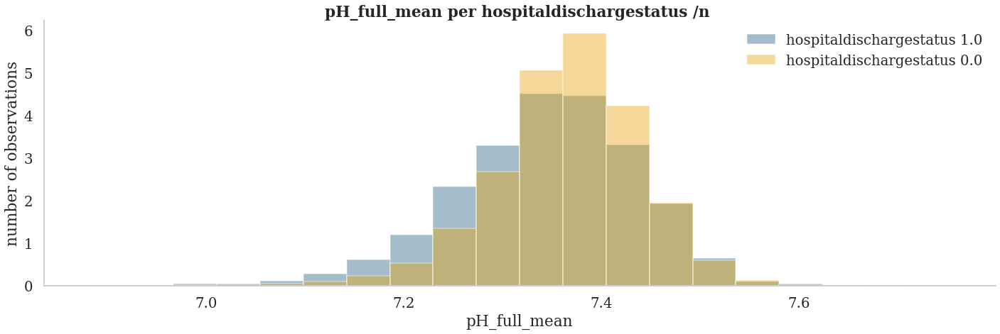

100%|██████████| 17/17 [02:14<00:00,  7.89s/it]


In [146]:
analyzer.analyze_feature_outcome_relation()